# Super-blind case studies

In a normal blind case study, you're not allowed to look at the tokens in any input prompt. **Restricted blind case studies** go further: in a restricted blind case study, you're not allowed to use any input-dependent information involving MLP0 transcoder features.

# Setup

In [1]:
from transcoder_circuits.circuit_analysis import *
from transcoder_circuits.feature_dashboards import *
from transcoder_circuits.replacement_ctx import *

## Load model

In [2]:
from sae_training.sparse_autoencoder import SparseAutoencoder

In [3]:
from transformer_lens import HookedTransformer, utils
model = HookedTransformer.from_pretrained('gpt2')

Loaded pretrained model gpt2 into HookedTransformer


## Loading data

In [4]:
# This function was stolen from one of Neel Nanda's exploratory notebooks
# Thanks, Neel!
import einops
def tokenize_and_concatenate(
    dataset,
    tokenizer,
    streaming = False,
    max_length = 1024,
    column_name = "text",
    add_bos_token = True,
):
    """Helper function to tokenizer and concatenate a dataset of text. This converts the text to tokens, concatenates them (separated by EOS tokens) and then reshapes them into a 2D array of shape (____, sequence_length), dropping the last batch. Tokenizers are much faster if parallelised, so we chop the string into 20, feed it into the tokenizer, in parallel with padding, then remove padding at the end.

    This tokenization is useful for training language models, as it allows us to efficiently train on a large corpus of text of varying lengths (without, eg, a lot of truncation or padding). Further, for models with absolute positional encodings, this avoids privileging early tokens (eg, news articles often begin with CNN, and models may learn to use early positional encodings to predict these)

    Args:
        dataset (Dataset): The dataset to tokenize, assumed to be a HuggingFace text dataset.
        tokenizer (AutoTokenizer): The tokenizer. Assumed to have a bos_token_id and an eos_token_id.
        streaming (bool, optional): Whether the dataset is being streamed. If True, avoids using parallelism. Defaults to False.
        max_length (int, optional): The length of the context window of the sequence. Defaults to 1024.
        column_name (str, optional): The name of the text column in the dataset. Defaults to 'text'.
        add_bos_token (bool, optional): . Defaults to True.

    Returns:
        Dataset: Returns the tokenized dataset, as a dataset of tensors, with a single column called "tokens"

    Note: There is a bug when inputting very small datasets (eg, <1 batch per process) where it just outputs nothing. I'm not super sure why
    """
    for key in dataset.features:
        if key != column_name:
            dataset = dataset.remove_columns(key)

    if tokenizer.pad_token is None:
        # We add a padding token, purely to implement the tokenizer. This will be removed before inputting tokens to the model, so we do not need to increment d_vocab in the model.
        tokenizer.add_special_tokens({"pad_token": "<PAD>"})
    # Define the length to chop things up into - leaving space for a bos_token if required
    if add_bos_token:
        seq_len = max_length - 1
    else:
        seq_len = max_length

    def tokenize_function(examples):
        text = examples[column_name]
        # Concatenate it all into an enormous string, separated by eos_tokens
        full_text = tokenizer.eos_token.join(text)
        # Divide into 20 chunks of ~ equal length
        num_chunks = 20
        chunk_length = (len(full_text) - 1) // num_chunks + 1
        chunks = [
            full_text[i * chunk_length : (i + 1) * chunk_length]
            for i in range(num_chunks)
        ]
        # Tokenize the chunks in parallel. Uses NumPy because HuggingFace map doesn't want tensors returned
        tokens = tokenizer(chunks, return_tensors="np", padding=True)[
            "input_ids"
        ].flatten()
        # Drop padding tokens
        tokens = tokens[tokens != tokenizer.pad_token_id]
        num_tokens = len(tokens)
        num_batches = num_tokens // (seq_len)
        # Drop the final tokens if not enough to make a full sequence
        tokens = tokens[: seq_len * num_batches]
        tokens = einops.rearrange(
            tokens, "(batch seq) -> batch seq", batch=num_batches, seq=seq_len
        )
        if add_bos_token:
            prefix = np.full((num_batches, 1), tokenizer.bos_token_id)
            tokens = np.concatenate([prefix, tokens], axis=1)
        return {"tokens": tokens}

    tokenized_dataset = dataset.map(
        tokenize_function,
        batched=True,
        remove_columns=[column_name],
    )
    #tokenized_dataset.set_format(type="torch", columns=["tokens"])
    return tokenized_dataset


In [5]:
from datasets import load_dataset
from huggingface_hub import HfApi

dataset = load_dataset('Skylion007/openwebtext', split='train', streaming=True)
dataset = dataset.shuffle(seed=42, buffer_size=10_000)
tokenized_owt = tokenize_and_concatenate(dataset, model.tokenizer, max_length=128, streaming=True)
tokenized_owt = tokenized_owt.shuffle(42)
tokenized_owt = tokenized_owt.take(12800*2)
owt_tokens = np.stack([x['tokens'] for x in tokenized_owt])

Token indices sequence length is longer than the specified maximum sequence length for this model (73252 > 1024). Running this sequence through the model will result in indexing errors


In [6]:
owt_tokens_torch = torch.from_numpy(owt_tokens).cuda()

# Load transcoders

In [7]:
transcoder_template = "./gpt-2-small-transcoders/final_sparse_autoencoder_gpt2-small_blocks.{}.ln2.hook_normalized_24576"
transcoders = []
for i in range(9):
    transcoders.append(SparseAutoencoder.load_from_pretrained(f"{transcoder_template.format(i)}.pt").eval())
tc8_sparsity = torch.load(f"{transcoder_template.format(8)}_log_feature_sparsity.pt")

In [8]:
import gc
gc.collect()
torch.cuda.empty_cache()

## Load transcoder 8 feature frequency info

In [9]:
live_features = np.arange(len(tc8_sparsity))[utils.to_numpy(tc8_sparsity > -4)]

# Blind case study: `live_features[1234]`


In [13]:
feature_idx = live_features[1234]
my_feature = make_sae_feature_vector(transcoders[8], feature_idx, use_encoder=True, token=-1)
print(my_feature)

mlp8tc[1447]@-1


In [14]:
# get scores
scores = get_feature_scores(model, transcoders[8], owt_tokens_torch[:128*100], feature_idx, batch_size=128, use_raw_scores=False)
uniform_samples = sample_uniform(scores, num_samples=50)

100%|██████████| 100/100 [00:24<00:00,  4.03it/s]


Let's get the indices of sufficiently-highly activating examples.

In [15]:
uniform_scores, uniform_idxs = uniform_samples[0], uniform_samples[1]
print(uniform_scores)

[ 0.      0.3833  0.7744  1.171   1.571   1.959   2.336   2.73    3.13
  3.492   3.916   4.3     4.703   5.11    5.48    5.918   6.26    6.676
  7.016   7.434   7.793   8.21    8.6     8.984   9.44    9.75   10.234
 10.54   10.984  11.37   11.73   12.06   12.516  12.8    13.34   13.66
 14.05   14.41   14.91   15.23   15.69   15.98   16.38   16.78   17.2
 17.88   18.05   18.44   18.7    19.16  ]


In [16]:
threshold = 11
uniform_idxs = uniform_idxs[uniform_scores>threshold]
uniform_scores = uniform_scores[uniform_scores>threshold]
for x in uniform_idxs: print(f'{x[0]}, {x[1]}')

2462, 65
11235, 68
4427, 81
3286, 28
11691, 6
6949, 20
7342, 115
11180, 23
3601, 47
4755, 40
11678, 81
12094, 15
3352, 34
5078, 106
296, 127
9816, 43
8053, 72
797, 110
3067, 79
10211, 57
8749, 45


## Input 3067, 79

In [17]:
prompt = owt_tokens_torch[3067, :79+1]
_, cache = model.run_with_cache(prompt)

In [18]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=5, num_branches=15)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[1447]@-1: 1.8e+01 <- mlp7tc[10932]@79: 3.5
Path [1]: mlp8tc[1447]@-1: 1.8e+01 <- mlp6tc[8713]@79: 1.7
Path [2]: mlp8tc[1447]@-1: 1.8e+01 <- mlp1tc[6094]@79: 1.7
Path [3]: mlp8tc[1447]@-1: 1.8e+01 <- mlp5tc[24030]@79: 1.5
Path [4]: mlp8tc[1447]@-1: 1.8e+01 <- mlp3tc[11199]@79: 1.3
Path [5]: mlp8tc[1447]@-1: 1.8e+01 <- mlp7tc[19667]@79: 1.2
Path [6]: mlp8tc[1447]@-1: 1.8e+01 <- mlp4tc[17646]@79: 0.98
Path [7]: mlp8tc[1447]@-1: 1.8e+01 <- mlp2tc[9537]@79: 0.89
Path [8]: mlp8tc[1447]@-1: 1.8e+01 <- mlp6tc[2015]@79: 0.44
Path [9]: mlp8tc[1447]@-1: 1.8e+01 <- mlp5tc[10976]@79: 0.41
Path [10]: mlp8tc[1447]@-1: 1.8e+01 <- mlp7tc[10932]@79: 3.5 <- mlp1tc[6094]@79: 0.55


Wow, all contributions come from the final token.

Let's look at connections to layer 0 features, I guess.

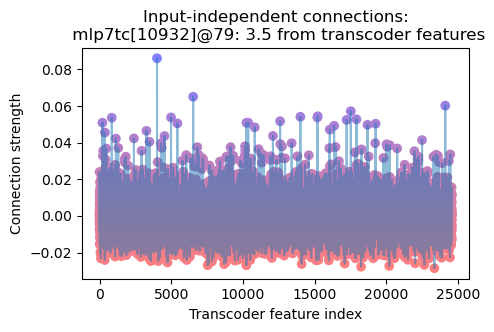

In [19]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [20]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 4012, k=5)

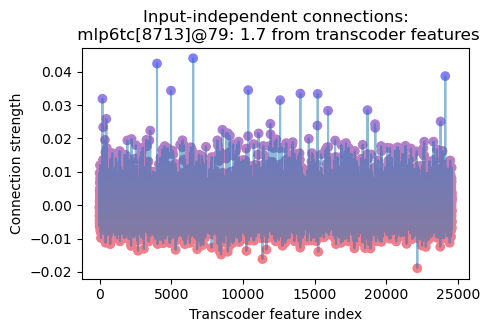

In [21]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [22]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 6533, k=5)

Yeah, this feature is looking simple -- just the token ` All`.

Is there any contribution from the context?

In [24]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=5, num_branches=15,
    filter=FeatureFilter(token=79, token_filter_type=FilterType.NE)
)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[1447]@-1: 1.8e+01 <- attn4[11]@78: 0.23
Path [1]: mlp8tc[1447]@-1: 1.8e+01 <- attn1[1]@78: 0.23
Path [2]: mlp8tc[1447]@-1: 1.8e+01 <- attn2[0]@78: 0.18
Path [3]: mlp8tc[1447]@-1: 1.8e+01 <- attn4[11]@77: 0.16
Path [4]: mlp8tc[1447]@-1: 1.8e+01 <- attn1[1]@77: 0.16
Path [5]: mlp8tc[1447]@-1: 1.8e+01 <- attn7[9]@78: 0.15
Path [6]: mlp8tc[1447]@-1: 1.8e+01 <- attn2[0]@77: 0.15
Path [7]: mlp8tc[1447]@-1: 1.8e+01 <- attn2[0]@76: 0.15
Path [8]: mlp8tc[1447]@-1: 1.8e+01 <- attn2[5]@76: 0.13
Path [9]: mlp8tc[1447]@-1: 1.8e+01 <- attn7[0]@78: 0.13
Path [10]: mlp8tc[1447]@-1: 1.8e+01 <- attn3[6]@77: 0.12
Path [11]: mlp8tc[1447]@-1: 1.8e+01 <- attn1[1]@76: 0.12
Path [12]: mlp8tc[1447]@-1: 1.8e+01 <- attn3[8]@76: 0.12
Path [13]: mlp8tc[1447]@-1: 1.8e+01 <- attn2[3]@78: 0.11
Path [14]: mlp8tc[1447]@-1: 1.8e+01 <- attn2[3]@78: 0.11 <- attn1[5]@77: 0.028
Path [15]: mlp8tc[1447]@-1: 1.8e+01 <- attn2[3]@78: 0.11 <- attn1[5]@78: 0.022
Path [16]: mlp8tc[1447]@-1: 1.8e+01 <- attn4[11]@78:

Very little contribution. Can we glean anything from it?

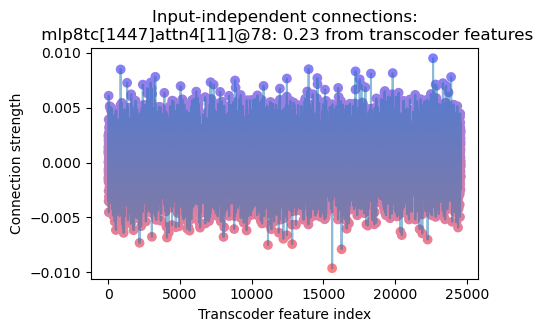

In [25]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [26]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 22650, k=5)

In [27]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 13970, k=5)

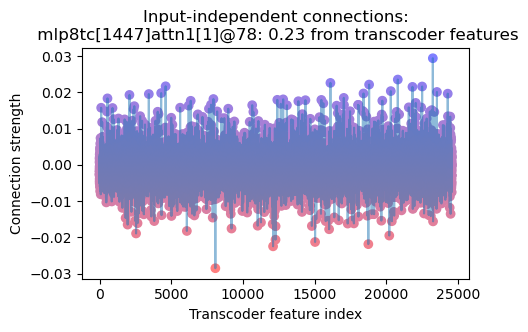

In [28]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [29]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 23253, k=5)

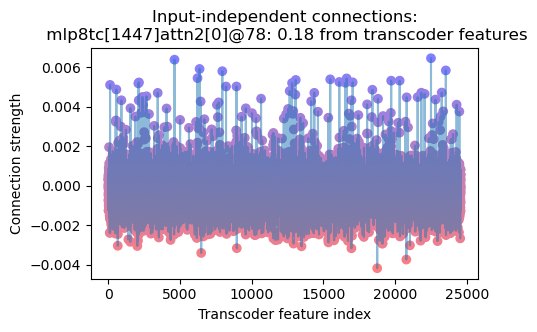

In [30]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

In [31]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 22505, k=5)

Okay, previous token was a period. Got ya. What about the antepenultimate one?

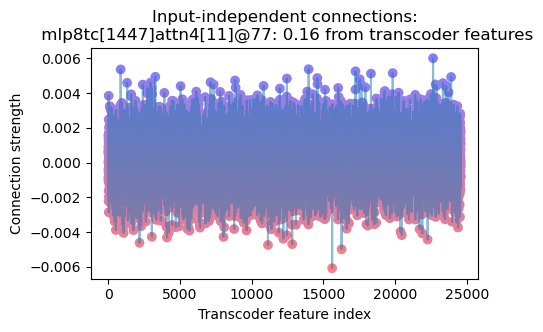

In [32]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

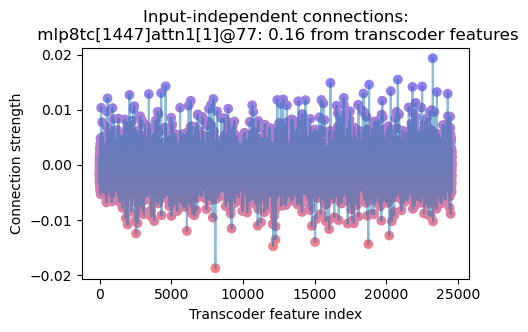

In [34]:
display_transcoder_pullback_features(model, all_paths[4][-1], transcoders[0])

In [35]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 23253, k=5)

Yeah, this is just the same stuff from before.

Probably not gonna get anything more out of this prompt.

**Tentative hypothesis**: single token feature on ` All`.

## Input 8053, 72

In [36]:
prompt = owt_tokens_torch[8053, :72+1]
_, cache = model.run_with_cache(prompt)

In [37]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=5, num_branches=15)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[1447]@-1: 1.8e+01 <- mlp7tc[10932]@72: 3.3
Path [1]: mlp8tc[1447]@-1: 1.8e+01 <- mlp6tc[8713]@72: 2.0
Path [2]: mlp8tc[1447]@-1: 1.8e+01 <- mlp3tc[11199]@72: 1.7
Path [3]: mlp8tc[1447]@-1: 1.8e+01 <- mlp1tc[6094]@72: 1.7
Path [4]: mlp8tc[1447]@-1: 1.8e+01 <- mlp5tc[24030]@72: 1.6
Path [5]: mlp8tc[1447]@-1: 1.8e+01 <- mlp4tc[17646]@72: 1.2
Path [6]: mlp8tc[1447]@-1: 1.8e+01 <- mlp7tc[8008]@72: 1.0
Path [7]: mlp8tc[1447]@-1: 1.8e+01 <- mlp2tc[9537]@72: 0.96
Path [8]: mlp8tc[1447]@-1: 1.8e+01 <- mlp7tc[19667]@72: 0.58
Path [9]: mlp8tc[1447]@-1: 1.8e+01 <- mlp5tc[22889]@72: 0.38
Path [10]: mlp8tc[1447]@-1: 1.8e+01 <- mlp7tc[10932]@72: 3.3 <- mlp1tc[6094]@72: 0.57
Path [11]: mlp8tc[1447]@-1: 1.8e+01 <- mlp7tc[10932]@72: 3.3 <- mlp3tc[11199]@72: 0.55


Yeah, this is looking awfully familiar.

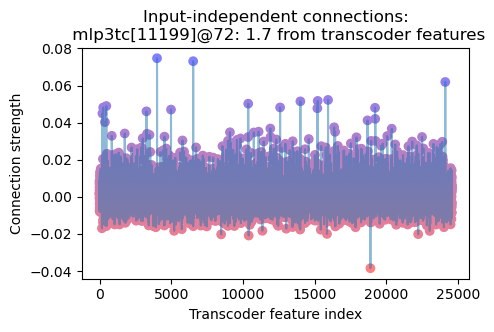

In [38]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

In [39]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 4012, k=5)

In [40]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 6533, k=5)

## Moment of truth: confirming/denying our hypothesis

**Final hypothesis**: Single token `All` feature.

In [42]:
display_activating_examples_dash(model, owt_tokens_torch[:128*100], scores, window_size=7)

## Post-mortem

Well that was boring.

# Blind case study: `live_features[5678]`

In [43]:
feature_idx = live_features[5678]
my_feature = make_sae_feature_vector(transcoders[8], feature_idx, use_encoder=True, token=-1)
print(my_feature)

mlp8tc[6569]@-1


In [44]:
# get scores
scores = get_feature_scores(model, transcoders[8], owt_tokens_torch[:128*100], feature_idx, batch_size=128, use_raw_scores=False)
uniform_samples = sample_uniform(scores, num_samples=50)

100%|██████████| 100/100 [00:24<00:00,  4.10it/s]


Let's get the indices of sufficiently-highly activating examples.

In [45]:
uniform_scores, uniform_idxs = uniform_samples[0], uniform_samples[1]
print(uniform_scores)

[ 0.      0.4812  0.9683  1.452   1.934   2.41    2.906   3.35    3.887
  4.348   4.844   5.277   5.75    6.273   6.71    7.09    7.617   8.25
  8.77    9.266   9.664  10.14   10.76   11.2    11.58   11.99   12.6
 13.086  13.48   13.97   14.33   15.04   15.47   15.84   16.48   16.88
 17.52   18.     18.4    18.89   19.36   19.61   20.25   20.89   21.86
 22.2    22.64   22.92   23.73  ]


In [46]:
threshold = 16
uniform_idxs = uniform_idxs[uniform_scores>threshold]
uniform_scores = uniform_scores[uniform_scores>threshold]
for x in uniform_idxs: print(f'{x[0]}, {x[1]}')

7025, 93
12184, 56
2041, 60
4707, 114
5241, 99
6612, 88
10834, 110
12346, 24
1626, 71
11969, 121
10179, 90
1777, 53
11931, 39
755, 122
8670, 121


## Input 755, 122

In [47]:
prompt = owt_tokens_torch[755, :122+1]
_, cache = model.run_with_cache(prompt)

In [48]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=5, num_branches=15)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[6569]@-1: 2.3e+01 <- mlp7tc[17738]@122: 4.5
Path [1]: mlp8tc[6569]@-1: 2.3e+01 <- mlp3tc[11401]@122: 2.8
Path [2]: mlp8tc[6569]@-1: 2.3e+01 <- mlp6tc[24442]@122: 2.6
Path [3]: mlp8tc[6569]@-1: 2.3e+01 <- mlp5tc[14599]@122: 2.4
Path [4]: mlp8tc[6569]@-1: 2.3e+01 <- mlp2tc[14639]@122: 2.1
Path [5]: mlp8tc[6569]@-1: 2.3e+01 <- mlp4tc[8572]@122: 1.3
Path [6]: mlp8tc[6569]@-1: 2.3e+01 <- mlp1tc[1522]@122: 1.1
Path [7]: mlp8tc[6569]@-1: 2.3e+01 <- attn2[2]@120: 0.61
Path [8]: mlp8tc[6569]@-1: 2.3e+01 <- attn4[9]@119: 0.49
Path [9]: mlp8tc[6569]@-1: 2.3e+01 <- attn4[11]@121: 0.39
Path [10]: mlp8tc[6569]@-1: 2.3e+01 <- mlp7tc[23097]@122: 0.39
Path [11]: mlp8tc[6569]@-1: 2.3e+01 <- mlp2tc[755]@122: 0.33
Path [12]: mlp8tc[6569]@-1: 2.3e+01 <- mlp7tc[17738]@122: 4.5 <- mlp3tc[11401]@122: 0.89
Path [13]: mlp8tc[6569]@-1: 2.3e+01 <- mlp3tc[11401]@122: 2.8 <- mlp2tc[14639]@122: 0.87
Path [14]: mlp8tc[6569]@-1: 2.3e+01 <- mlp7tc[17738]@122: 4.5 <- mlp5tc[14599]@122: 0.7
Path [15]: ml

Alright, we got some contributions from earlier tokens. Nice change of pace.

Let's start by looking at the last token.

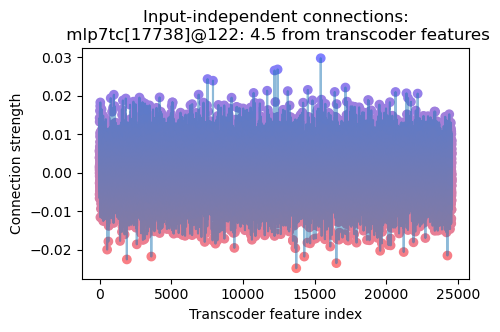

In [49]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [50]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 15432, k=5)

In [51]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 12425, k=5)

In [52]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 12209, k=5)

Okay, it's about interviews. Or maybe transcripts?

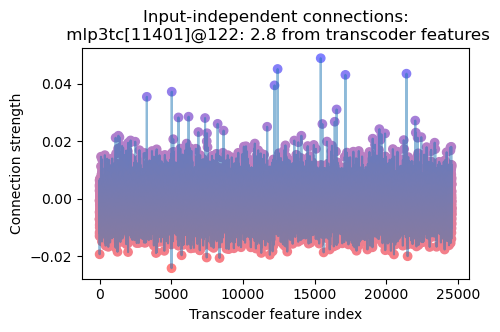

In [53]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [56]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 21414, k=5)

Interesting -- the MLP3 transcoder feature also has a connection to an MLP0 feature that fires on verbs. I wonder -- is the current token "interview" as a verb?

Now, let's look at contribution from the context.

In [57]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=5, num_branches=15,
    filter=FeatureFilter(token=122, token_filter_type=FilterType.NE)
)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[6569]@-1: 2.3e+01 <- attn2[2]@120: 0.61
Path [1]: mlp8tc[6569]@-1: 2.3e+01 <- attn4[9]@119: 0.49
Path [2]: mlp8tc[6569]@-1: 2.3e+01 <- attn4[11]@121: 0.39
Path [3]: mlp8tc[6569]@-1: 2.3e+01 <- attn8[5]@119: 0.26
Path [4]: mlp8tc[6569]@-1: 2.3e+01 <- attn3[9]@120: 0.23
Path [5]: mlp8tc[6569]@-1: 2.3e+01 <- attn3[8]@120: 0.22
Path [6]: mlp8tc[6569]@-1: 2.3e+01 <- attn1[0]@120: 0.21
Path [7]: mlp8tc[6569]@-1: 2.3e+01 <- attn2[8]@120: 0.2
Path [8]: mlp8tc[6569]@-1: 2.3e+01 <- attn8[7]@121: 0.19
Path [9]: mlp8tc[6569]@-1: 2.3e+01 <- attn2[3]@121: 0.19
Path [10]: mlp8tc[6569]@-1: 2.3e+01 <- attn1[1]@120: 0.16
Path [11]: mlp8tc[6569]@-1: 2.3e+01 <- attn8[9]@121: 0.15
Path [12]: mlp8tc[6569]@-1: 2.3e+01 <- attn3[2]@121: 0.13
Path [13]: mlp8tc[6569]@-1: 2.3e+01 <- attn8[5]@121: 0.13
Path [14]: mlp8tc[6569]@-1: 2.3e+01 <- attn7[4]@120: 0.12
Path [15]: mlp8tc[6569]@-1: 2.3e+01 <- attn2[2]@120: 0.61 <- mlp1tc[5517]@120: 0.065
Path [16]: mlp8tc[6569]@-1: 2.3e+01 <- attn4[9]@119: 0.

### Token 121

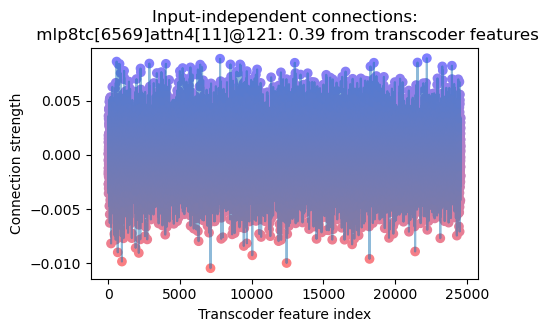

In [65]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

In [66]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 22216, k=5)

In [67]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 7791, k=5)

Not gonna get anything here, it seems.

### Token 120

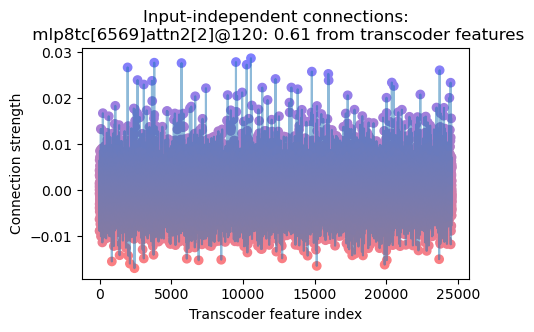

In [58]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [59]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 10564, k=5)

In [60]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 9519, k=5)

Okay, I'm thinking that this feature is probably firing on "in an interview"...

### Token 119

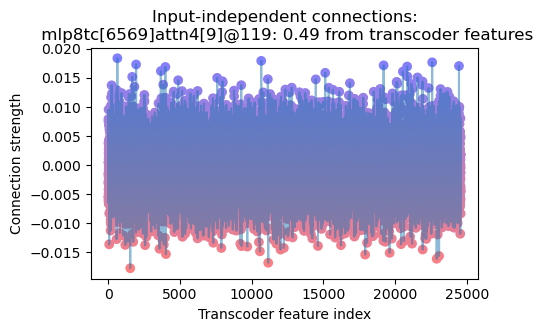

In [61]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [62]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 625, k=5)

In [63]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 10661, k=5)

In [64]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 22588, k=5)

Okay, this is spicy...

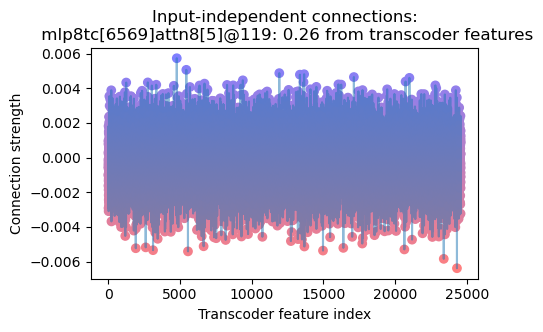

In [68]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

In [69]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 4771, k=5)

In [70]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 5436, k=5)

This path is probably no good.

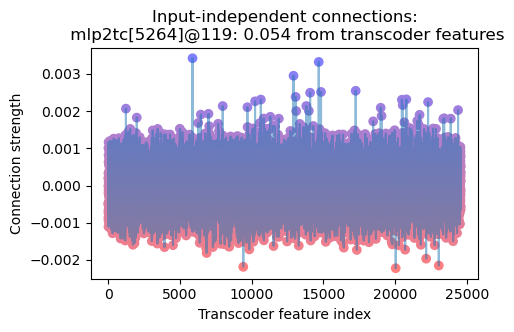

In [71]:
display_transcoder_pullback_features(model, all_paths[16][-1], transcoders[0])

In [72]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 5870, k=5)

In [73]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 14674, k=5)

In [74]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 12915, k=5)

Now we're getting somewhere. Hypothesis: "said in an interview"

## Input 1777, 53

In [75]:
prompt = owt_tokens_torch[1777, :53+1]
_, cache = model.run_with_cache(prompt)

In [76]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=5, num_branches=15)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[6569]@-1: 2.2e+01 <- mlp7tc[17738]@53: 4.1
Path [1]: mlp8tc[6569]@-1: 2.2e+01 <- mlp3tc[11401]@53: 2.7
Path [2]: mlp8tc[6569]@-1: 2.2e+01 <- mlp6tc[24442]@53: 2.3
Path [3]: mlp8tc[6569]@-1: 2.2e+01 <- mlp5tc[14599]@53: 2.2
Path [4]: mlp8tc[6569]@-1: 2.2e+01 <- mlp2tc[14639]@53: 2.1
Path [5]: mlp8tc[6569]@-1: 2.2e+01 <- mlp4tc[8572]@53: 1.2
Path [6]: mlp8tc[6569]@-1: 2.2e+01 <- mlp1tc[1522]@53: 0.97
Path [7]: mlp8tc[6569]@-1: 2.2e+01 <- attn2[2]@51: 0.59
Path [8]: mlp8tc[6569]@-1: 2.2e+01 <- attn4[11]@52: 0.42
Path [9]: mlp8tc[6569]@-1: 2.2e+01 <- mlp7tc[23097]@53: 0.42
Path [10]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[9]@53: 0.35
Path [11]: mlp8tc[6569]@-1: 2.2e+01 <- mlp5tc[4464]@53: 0.34
Path [12]: mlp8tc[6569]@-1: 2.2e+01 <- mlp7tc[17738]@53: 4.1 <- mlp3tc[11401]@53: 0.85
Path [13]: mlp8tc[6569]@-1: 2.2e+01 <- mlp3tc[11401]@53: 2.7 <- mlp2tc[14639]@53: 0.84
Path [14]: mlp8tc[6569]@-1: 2.2e+01 <- mlp5tc[14599]@53: 2.2 <- mlp3tc[11401]@53: 0.68
Path [15]: mlp8tc[6569]@-1: 

Top features for current token are the same as last time -- probably the same deal. What about the context?

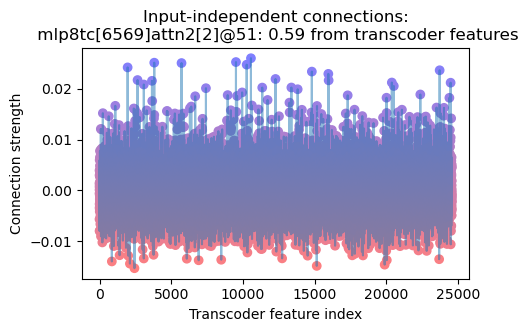

In [77]:
display_transcoder_pullback_features(model, all_paths[7][-1], transcoders[0])

In [78]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 10564, k=5)

There's our "in" again.

How about earlier tokens?

In [79]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=5, num_branches=15,
    filter=FeatureFilter(token=53, token_filter_type=FilterType.NE)
)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[6569]@-1: 2.2e+01 <- attn2[2]@51: 0.59
Path [1]: mlp8tc[6569]@-1: 2.2e+01 <- attn4[11]@52: 0.42
Path [2]: mlp8tc[6569]@-1: 2.2e+01 <- attn4[9]@50: 0.23
Path [3]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[9]@52: 0.22
Path [4]: mlp8tc[6569]@-1: 2.2e+01 <- attn3[9]@51: 0.2
Path [5]: mlp8tc[6569]@-1: 2.2e+01 <- attn1[0]@51: 0.2
Path [6]: mlp8tc[6569]@-1: 2.2e+01 <- attn2[8]@51: 0.18
Path [7]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[9]@50: 0.17
Path [8]: mlp8tc[6569]@-1: 2.2e+01 <- attn3[8]@51: 0.17
Path [9]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[9]@16: 0.17
Path [10]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[9]@51: 0.17
Path [11]: mlp8tc[6569]@-1: 2.2e+01 <- attn2[3]@52: 0.15
Path [12]: mlp8tc[6569]@-1: 2.2e+01 <- attn4[1]@51: 0.14
Path [13]: mlp8tc[6569]@-1: 2.2e+01 <- attn4[1]@52: 0.13
Path [14]: mlp8tc[6569]@-1: 2.2e+01 <- attn1[1]@51: 0.13
Path [15]: mlp8tc[6569]@-1: 2.2e+01 <- attn2[2]@51: 0.59 <- mlp1tc[5517]@51: 0.056
Path [16]: mlp8tc[6569]@-1: 2.2e+01 <- attn2[3]@52: 0.15 <- mlp1tc[3903]@

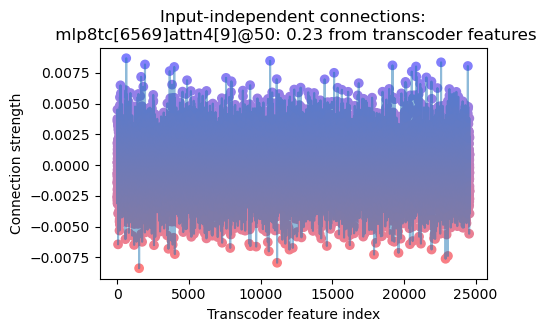

In [80]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

In [81]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 625, k=5)

In [82]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 10661, k=5)

There's this thing again.... What's up with this attention head?

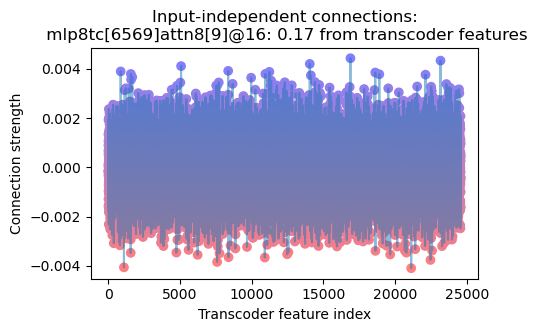

In [83]:
display_transcoder_pullback_features(model, all_paths[9][-1], transcoders[0])

In [86]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 14048, k=5)

So token 16 is contributing by talking about elections?

## Input 10179, 90

In [87]:
prompt = owt_tokens_torch[10179, :90+1]
_, cache = model.run_with_cache(prompt)

In [88]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=5, num_branches=15)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[6569]@-1: 2.2e+01 <- mlp7tc[17738]@90: 4.3
Path [1]: mlp8tc[6569]@-1: 2.2e+01 <- mlp3tc[11401]@90: 2.9
Path [2]: mlp8tc[6569]@-1: 2.2e+01 <- mlp6tc[24442]@90: 2.6
Path [3]: mlp8tc[6569]@-1: 2.2e+01 <- mlp5tc[14599]@90: 2.5
Path [4]: mlp8tc[6569]@-1: 2.2e+01 <- mlp2tc[14639]@90: 2.3
Path [5]: mlp8tc[6569]@-1: 2.2e+01 <- mlp4tc[8572]@90: 1.3
Path [6]: mlp8tc[6569]@-1: 2.2e+01 <- mlp1tc[1522]@90: 1.1
Path [7]: mlp8tc[6569]@-1: 2.2e+01 <- attn2[2]@88: 0.59
Path [8]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[9]@86: 0.55
Path [9]: mlp8tc[6569]@-1: 2.2e+01 <- attn4[11]@89: 0.46
Path [10]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[9]@90: 0.45
Path [11]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[7]@89: 0.42
Path [12]: mlp8tc[6569]@-1: 2.2e+01 <- mlp3tc[11401]@90: 2.9 <- mlp2tc[14639]@90: 0.9
Path [13]: mlp8tc[6569]@-1: 2.2e+01 <- mlp7tc[17738]@90: 4.3 <- mlp3tc[11401]@90: 0.87
Path [14]: mlp8tc[6569]@-1: 2.2e+01 <- mlp5tc[14599]@90: 2.5 <- mlp3tc[11401]@90: 0.7
Path [15]: mlp8tc[6569]@-1: 2.2e+01 <- m

Last tokne, same as before. Let's look at the earlier tokens.

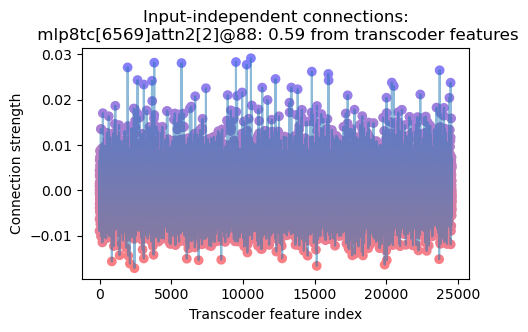

In [89]:
display_transcoder_pullback_features(model, all_paths[7][-1], transcoders[0])

In [90]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 10564, k=5)

In [91]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=5, num_branches=20,
    filter=FeatureFilter(token=90, token_filter_type=FilterType.NE)
)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[6569]@-1: 2.2e+01 <- attn2[2]@88: 0.59
Path [1]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[9]@86: 0.55
Path [2]: mlp8tc[6569]@-1: 2.2e+01 <- attn4[11]@89: 0.46
Path [3]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[7]@89: 0.42
Path [4]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[9]@89: 0.39
Path [5]: mlp8tc[6569]@-1: 2.2e+01 <- attn4[9]@86: 0.32
Path [6]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[5]@86: 0.31
Path [7]: mlp8tc[6569]@-1: 2.2e+01 <- attn8[9]@88: 0.23
Path [8]: mlp8tc[6569]@-1: 2.2e+01 <- attn2[8]@88: 0.2
Path [9]: mlp8tc[6569]@-1: 2.2e+01 <- attn3[8]@88: 0.19
Path [10]: mlp8tc[6569]@-1: 2.2e+01 <- attn2[3]@89: 0.18
Path [11]: mlp8tc[6569]@-1: 2.2e+01 <- attn1[0]@88: 0.17
Path [12]: mlp8tc[6569]@-1: 2.2e+01 <- attn3[9]@88: 0.16
Path [13]: mlp8tc[6569]@-1: 2.2e+01 <- attn6[8]@88: 0.16
Path [14]: mlp8tc[6569]@-1: 2.2e+01 <- attn4[1]@88: 0.15
Path [15]: mlp8tc[6569]@-1: 2.2e+01 <- attn4[1]@89: 0.15
Path [16]: mlp8tc[6569]@-1: 2.2e+01 <- attn1[1]@88: 0.13
Path [17]: mlp8tc[6569]@-1: 2.2e+01 <- at

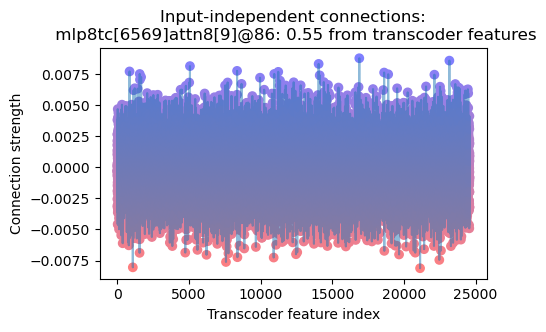

In [92]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [93]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 16885, k=5)

In [94]:
subcircuit = greedy_get_top_paths(model, transcoders, cache, all_paths[1][-1], num_iters=5, num_branches=15,
    filter=FeatureFilter(token=90, token_filter_type=FilterType.NE)
)
subcircuit = get_paths_via_filter(subcircuit, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(subcircuit)

Path [0]: attn8[9]@86: 0.55 <- attn7[5]@3: 0.061
Path [1]: attn8[9]@86: 0.55 <- attn6[0]@85: 0.043
Path [2]: attn8[9]@86: 0.55 <- attn5[10]@53: 0.039
Path [3]: attn8[9]@86: 0.55 <- mlp6tc[20291]@86: 0.029
Path [4]: attn8[9]@86: 0.55 <- mlp2tc[21478]@86: 0.023
Path [5]: attn8[9]@86: 0.55 <- mlp3tc[11013]@86: 0.02
Path [6]: attn8[9]@86: 0.55 <- mlp7tc[15108]@86: 0.019
Path [7]: attn8[9]@86: 0.55 <- attn4[11]@85: 0.017
Path [8]: attn8[9]@86: 0.55 <- mlp7tc[9748]@86: 0.015
Path [9]: attn8[9]@86: 0.55 <- mlp7tc[5418]@86: 0.014
Path [10]: attn8[9]@86: 0.55 <- mlp5tc[20926]@86: 0.014
Path [11]: attn8[9]@86: 0.55 <- attn6[3]@53: 0.013
Path [12]: attn8[9]@86: 0.55 <- attn7[5]@53: 0.013
Path [13]: attn8[9]@86: 0.55 <- mlp4tc[6189]@86: 0.012
Path [14]: attn8[9]@86: 0.55 <- attn5[10]@53: 0.039 <- attn4[9]@43: 0.026
Path [15]: attn8[9]@86: 0.55 <- attn6[0]@85: 0.043 <- attn5[10]@53: 0.015
Path [16]: attn8[9]@86: 0.55 <- mlp2tc[21478]@86: 0.023 <- mlp1tc[14339]@86: 0.013
Path [17]: attn8[9]@86: 0.55

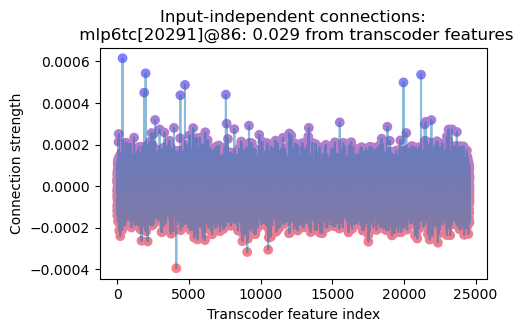

In [98]:
display_transcoder_pullback_features(model, subcircuit[3][-1], transcoders[0])

In [99]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 372, k=5)

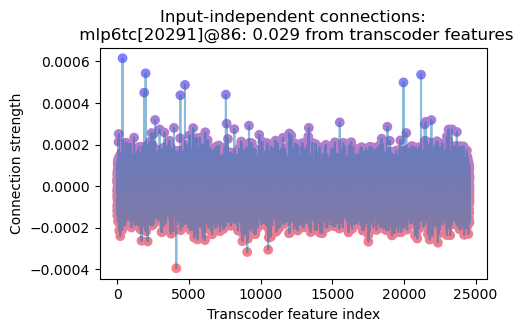

In [98]:
display_transcoder_pullback_features(model, subcircuit[3][-1], transcoders[0])

In [99]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 372, k=5)

Yeah, I think I have a good idea of what's going on, at this point.

## Moment of truth: confirming/denying our hypothesis

**Final hypothesis**: "told/said in an interview"

In [102]:
display_activating_examples_dash(model, owt_tokens_torch[:128*100], scores, window_size=7)

This seems to make enough sense. But what about the possibility that the quotation marks are necessary?

In [103]:
test_prompt = "said in an interview"
scores = get_feature_scores(model, transcoders[8], model.tokenizer(test_prompt, return_tensors='pt').input_ids, feature_idx, batch_size=128, use_raw_scores=False)
print(scores)

100%|██████████| 1/1 [00:00<00:00,  3.90it/s]

[[ 0.    0.    0.   20.48]]


Nope, looks like that's all you need.

# Blind case study: `live_features[7777]`


In [10]:
feature_idx = live_features[7777]
my_feature = make_sae_feature_vector(transcoders[8], feature_idx, use_encoder=True, token=-1)
print(my_feature)

mlp8tc[9030]@-1


In [11]:
# get scores
scores = get_feature_scores(model, transcoders[8], owt_tokens_torch[:128*100], feature_idx, batch_size=128, use_raw_scores=False)
uniform_samples = sample_uniform(scores, num_samples=50)

100%|██████████| 100/100 [00:24<00:00,  4.09it/s]


Let's get the indices of sufficiently-highly activating examples.

In [12]:
uniform_scores, uniform_idxs = uniform_samples[0], uniform_samples[1]
print(uniform_scores)

[0.     0.1449 0.289  0.4336 0.578  0.722  0.8677 1.012  1.157  1.303
 1.446  1.592  1.734  1.878  2.023  2.17   2.312  2.457  2.598  2.744
 2.896  3.037  3.178  3.324  3.467  3.615  3.762  3.9    4.05   4.19
 4.336  4.473  4.63   4.77   4.914  5.043  5.203  5.348  5.51   5.645
 5.766  5.93   6.04   6.207  6.42   6.492  6.71   7.082 ]


In [13]:
threshold = 5.2
uniform_idxs = uniform_idxs[uniform_scores>threshold]
uniform_scores = uniform_scores[uniform_scores>threshold]
for x in uniform_idxs: print(f'{x[0]}, {x[1]}')

11971, 26
8136, 23
2560, 89
2448, 91
12267, 65
8867, 126
4429, 58
1790, 19
9674, 42
12523, 8
6050, 125
4153, 73


## Input 6050, 125

In [14]:
prompt = owt_tokens_torch[6050, :125+1]
_, cache = model.run_with_cache(prompt)

In [18]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[9030]@-1: 6.7 <- mlp1tc[9530]@125: 0.55
Path [1]: mlp8tc[9030]@-1: 6.7 <- mlp6tc[24414]@125: 0.47
Path [2]: mlp8tc[9030]@-1: 6.7 <- attn7[0]@122: 0.35
Path [3]: mlp8tc[9030]@-1: 6.7 <- attn4[11]@124: 0.3
Path [4]: mlp8tc[9030]@-1: 6.7 <- mlp7tc[16137]@125: 0.25
Path [5]: mlp8tc[9030]@-1: 6.7 <- mlp1tc[8043]@125: 0.24
Path [6]: mlp8tc[9030]@-1: 6.7 <- attn4[3]@123: 0.23
Path [7]: mlp8tc[9030]@-1: 6.7 <- attn8[7]@122: 0.22
Path [8]: mlp8tc[9030]@-1: 6.7 <- mlp2tc[12687]@125: 0.2
Path [9]: mlp8tc[9030]@-1: 6.7 <- attn2[2]@123: 0.19
Path [10]: mlp8tc[9030]@-1: 6.7 <- attn3[3]@124: 0.19
Path [11]: mlp8tc[9030]@-1: 6.7 <- mlp1tc[10006]@125: 0.16
Path [12]: mlp8tc[9030]@-1: 6.7 <- attn7[8]@123: 0.15
Path [13]: mlp8tc[9030]@-1: 6.7 <- attn8[9]@125: 0.13
Path [14]: mlp8tc[9030]@-1: 6.7 <- mlp2tc[12687]@125: 0.2 <- mlp1tc[9530]@125: 0.056


Hmm, some contributions from earlier tokens, too.

First, let's look at connections of layer 0 features to final token..

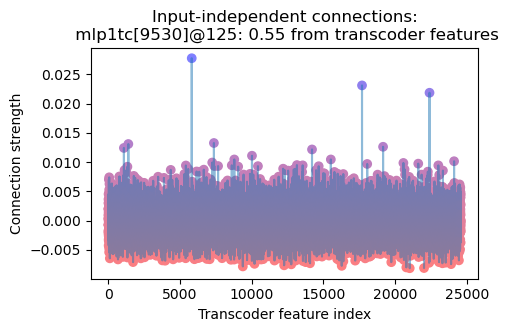

In [19]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [20]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 5814, k=5)

In [21]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 17693, k=5)

In [22]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 22402, k=5)

Alright, probably "biologic"... What about other current token path?

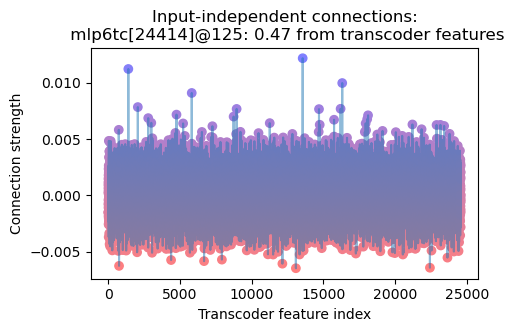

In [24]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [25]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 13554, k=5)

In [26]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 1391, k=5)

In [27]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 16313, k=5)

Now this confuses things. Maybe current token is sociology or anthroplogy or ecology or something similar. Ornithology, perchance?

Next, look at earlier tokens. I doubt that things will be as clear, because attention pullbacks tend not to be.

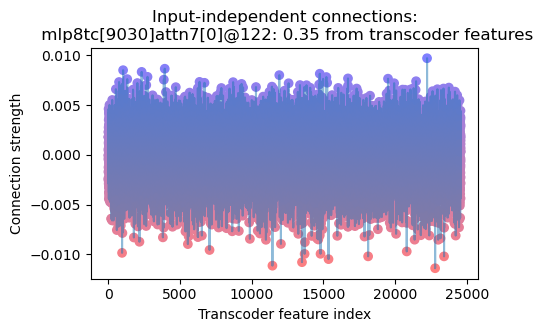

In [28]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

In [29]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 22230, k=5)

In [30]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 3931, k=5)

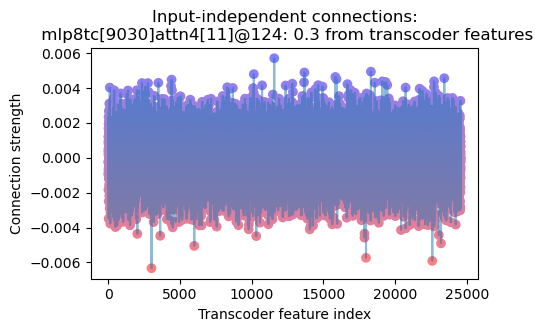

In [31]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

In [32]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 11570, k=5)

Yeah, a bit unclear.

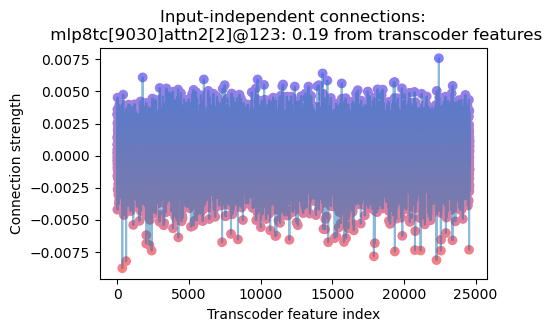

In [33]:
display_transcoder_pullback_features(model, all_paths[9][-1], transcoders[0])

In [35]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 14325, k=5)

## Input 4153, 73

In [36]:
prompt = owt_tokens_torch[4153, :73+1]
_, cache = model.run_with_cache(prompt)

In [37]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[9030]@-1: 7.1 <- mlp6tc[12258]@73: 0.49
Path [1]: mlp8tc[9030]@-1: 7.1 <- attn3[0]@30: 0.4
Path [2]: mlp8tc[9030]@-1: 7.1 <- attn7[0]@72: 0.29
Path [3]: mlp8tc[9030]@-1: 7.1 <- attn5[6]@72: 0.29
Path [4]: mlp8tc[9030]@-1: 7.1 <- mlp3tc[5714]@73: 0.26
Path [5]: mlp8tc[9030]@-1: 7.1 <- mlp6tc[24414]@73: 0.25
Path [6]: mlp8tc[9030]@-1: 7.1 <- mlp2tc[12687]@73: 0.23
Path [7]: mlp8tc[9030]@-1: 7.1 <- mlp7tc[16137]@73: 0.2
Path [8]: mlp8tc[9030]@-1: 7.1 <- mlp7tc[2084]@73: 0.19
Path [9]: mlp8tc[9030]@-1: 7.1 <- attn3[0]@73: 0.19
Path [10]: mlp8tc[9030]@-1: 7.1 <- attn5[10]@30: 0.17
Path [11]: mlp8tc[9030]@-1: 7.1 <- attn3[0]@48: 0.16
Path [12]: mlp8tc[9030]@-1: 7.1 <- mlp7tc[17523]@73: 0.14
Path [13]: mlp8tc[9030]@-1: 7.1 <- mlp6tc[12258]@73: 0.49 <- attn3[0]@30: 0.062
Path [14]: mlp8tc[9030]@-1: 7.1 <- attn7[0]@72: 0.29 <- attn6[9]@30: 0.058


Huh? We're getting contributions all the way back from token 30!

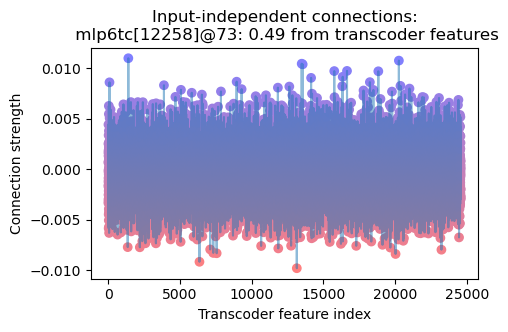

In [38]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [39]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 1391, k=5)

Yeah, it's another "biology" token.

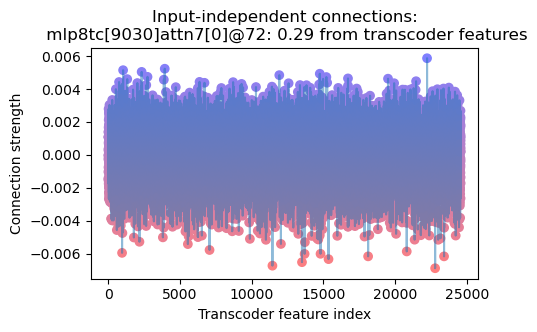

In [40]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

In [44]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 22230, k=5)

Again, `attn7[0]` on the previous token, with the same top MLP0 input-independent features.

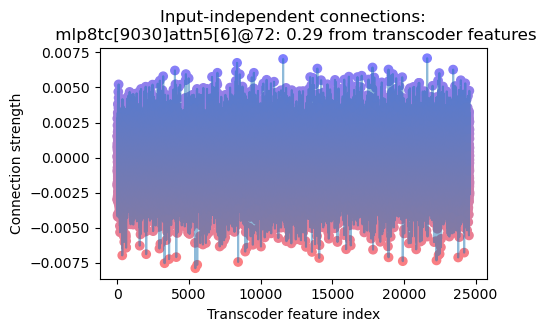

In [45]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

In [48]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 11570, k=5)

Weird -- MLP0 feature 11570 showed up elsewhere as well.

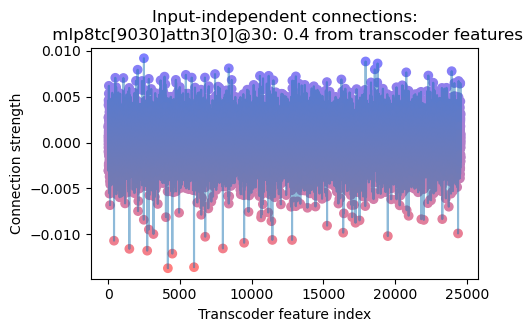

In [50]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [53]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 18781, k=5)

## Input 12523, 8

In [116]:
prompt = owt_tokens_torch[12523, :8+1]
_, cache = model.run_with_cache(prompt)

In [117]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=5, num_branches=30)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[9030]@-1: 6.5 <- mlp1tc[8043]@8: 0.37
Path [1]: mlp8tc[9030]@-1: 6.5 <- mlp6tc[12258]@8: 0.36
Path [2]: mlp8tc[9030]@-1: 6.5 <- mlp6tc[24414]@8: 0.36
Path [3]: mlp8tc[9030]@-1: 6.5 <- mlp7tc[16137]@8: 0.23
Path [4]: mlp8tc[9030]@-1: 6.5 <- mlp2tc[12687]@8: 0.21
Path [5]: mlp8tc[9030]@-1: 6.5 <- attn8[7]@7: 0.21
Path [6]: mlp8tc[9030]@-1: 6.5 <- mlp3tc[5714]@8: 0.19
Path [7]: mlp8tc[9030]@-1: 6.5 <- mlp4tc[3755]@8: 0.17
Path [8]: mlp8tc[9030]@-1: 6.5 <- mlp5tc[6938]@8: 0.15
Path [9]: mlp8tc[9030]@-1: 6.5 <- mlp3tc[16630]@8: 0.14
Path [10]: mlp8tc[9030]@-1: 6.5 <- attn8[0]@7: 0.13
Path [11]: mlp8tc[9030]@-1: 6.5 <- mlp7tc[11379]@8: 0.12
Path [12]: mlp8tc[9030]@-1: 6.5 <- mlp5tc[646]@8: 0.1
Path [13]: mlp8tc[9030]@-1: 6.5 <- attn4[0]@7: 0.1
Path [14]: mlp8tc[9030]@-1: 6.5 <- mlp3tc[8211]@8: 0.1
Path [15]: mlp8tc[9030]@-1: 6.5 <- mlp7tc[10752]@8: 0.094
Path [16]: mlp8tc[9030]@-1: 6.5 <- mlp4tc[2415]@8: 0.09
Path [17]: mlp8tc[9030]@-1: 6.5 <- attn2[3]@7: 0.089


Seems like mostly like the contributions come from the current token in this example? This causes me to update my hypothesis towards thinking that we have a single-token feature on our hands.

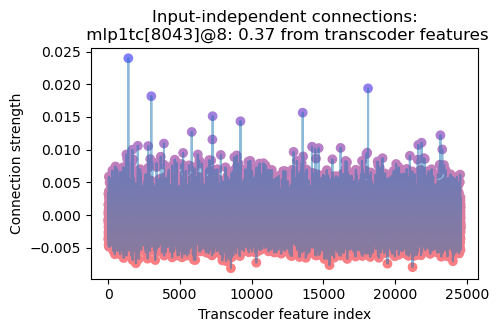

In [57]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [61]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 1391, k=5)

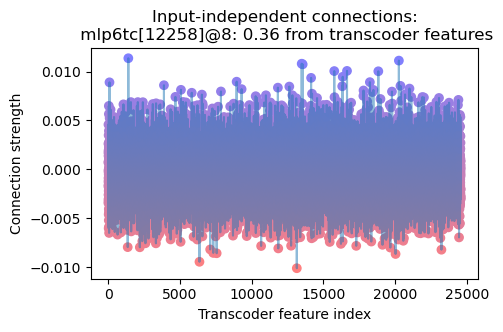

In [62]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

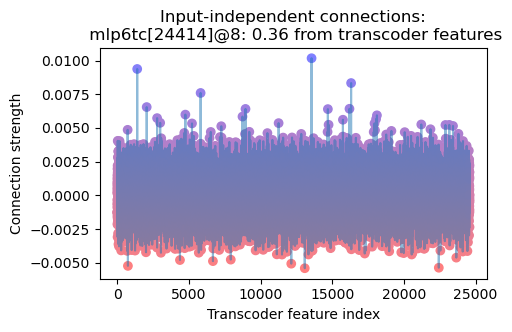

In [63]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

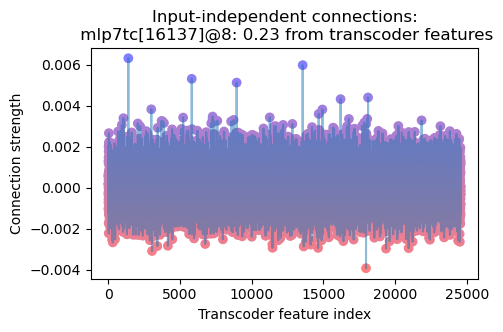

In [65]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

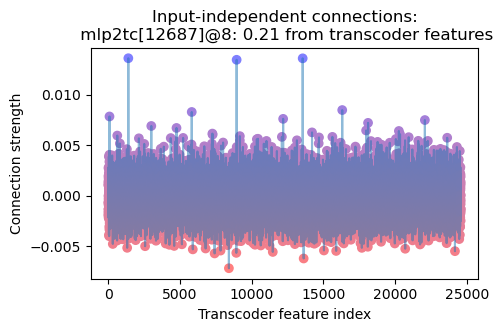

In [66]:
display_transcoder_pullback_features(model, all_paths[4][-1], transcoders[0])

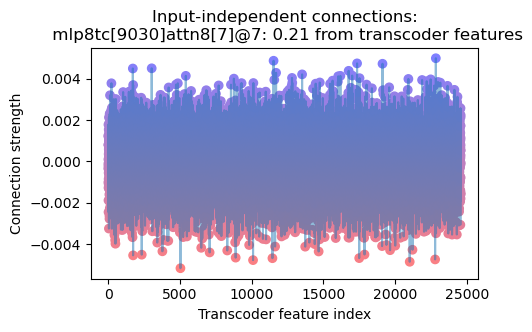

In [67]:
display_transcoder_pullback_features(model, all_paths[5][-1], transcoders[0])

Attention doesn't seem to yield anything.

## Input 1790, 19

In [118]:
prompt = owt_tokens_torch[1790, :19+1]
_, cache = model.run_with_cache(prompt)

In [119]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[9030]@-1: 6.2 <- attn8[4]@18: 0.28
Path [1]: mlp8tc[9030]@-1: 6.2 <- mlp6tc[24414]@19: 0.27
Path [2]: mlp8tc[9030]@-1: 6.2 <- attn4[3]@19: 0.22
Path [3]: mlp8tc[9030]@-1: 6.2 <- mlp2tc[12687]@19: 0.22
Path [4]: mlp8tc[9030]@-1: 6.2 <- mlp7tc[16137]@19: 0.2
Path [5]: mlp8tc[9030]@-1: 6.2 <- attn4[1]@18: 0.16
Path [6]: mlp8tc[9030]@-1: 6.2 <- mlp6tc[12258]@19: 0.15
Path [7]: mlp8tc[9030]@-1: 6.2 <- attn3[8]@18: 0.15
Path [8]: mlp8tc[9030]@-1: 6.2 <- mlp6tc[11516]@19: 0.15
Path [9]: mlp8tc[9030]@-1: 6.2 <- attn3[0]@19: 0.14
Path [10]: mlp8tc[9030]@-1: 6.2 <- attn7[8]@19: 0.14
Path [11]: mlp8tc[9030]@-1: 6.2 <- mlp1tc[11577]@19: 0.13
Path [12]: mlp8tc[9030]@-1: 6.2 <- attn5[10]@19: 0.13


Hmm -- contribution from previous token!

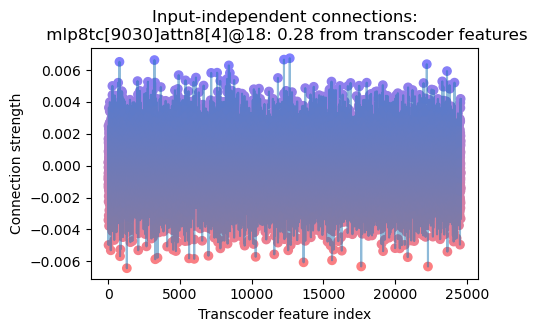

In [76]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

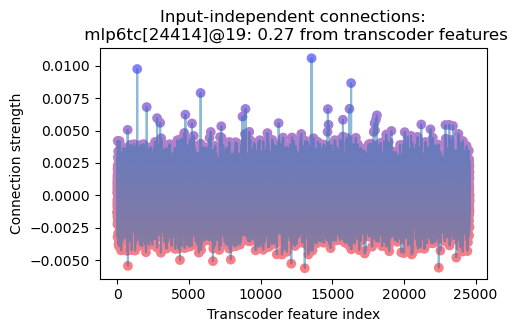

In [80]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

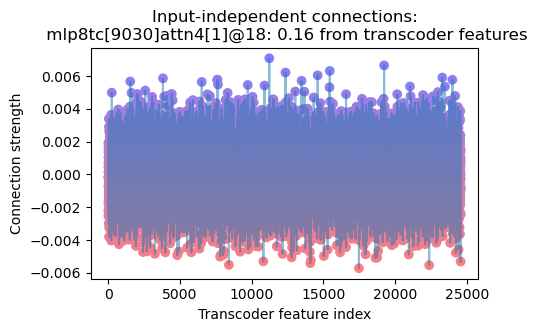

In [89]:
display_transcoder_pullback_features(model, all_paths[5][-1], transcoders[0])

In [91]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 19234, k=5)

Yeah, attention just isn't helping here. What if we look deeper at this subcircuit?

In [120]:
subcircuit = greedy_get_top_paths(model, transcoders, cache, all_paths[0][-1], num_iters=6, num_branches=20)
subcircuit = get_paths_via_filter(subcircuit, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(subcircuit)

Path [0]: attn8[4]@18: 0.28 <- attn7[8]@17: 0.037
Path [1]: attn8[4]@18: 0.28 <- attn3[7]@17: 0.015
Path [2]: attn8[4]@18: 0.28 <- attn7[8]@16: 0.015
Path [3]: attn8[4]@18: 0.28 <- mlp6tc[23863]@18: 0.014
Path [4]: attn8[4]@18: 0.28 <- mlp6tc[11084]@18: 0.014
Path [5]: attn8[4]@18: 0.28 <- mlp7tc[10184]@18: 0.014
Path [6]: attn8[4]@18: 0.28 <- attn7[0]@17: 0.011
Path [7]: attn8[4]@18: 0.28 <- attn6[3]@16: 0.011
Path [8]: attn8[4]@18: 0.28 <- mlp6tc[14501]@18: 0.011
Path [9]: attn8[4]@18: 0.28 <- mlp5tc[20037]@18: 0.01
Path [10]: attn8[4]@18: 0.28 <- mlp6tc[3650]@18: 0.0098
Path [11]: attn8[4]@18: 0.28 <- attn6[3]@17: 0.0093
Path [12]: attn8[4]@18: 0.28 <- attn7[3]@16: 0.0073
Path [13]: attn8[4]@18: 0.28 <- attn4[9]@17: 0.0073
Path [14]: attn8[4]@18: 0.28 <- attn4[5]@16: 0.0066
Path [15]: attn8[4]@18: 0.28 <- mlp7tc[9258]@18: 0.0064
Path [16]: attn8[4]@18: 0.28 <- attn7[0]@17: 0.011 <- mlp3tc[19274]@17: 0.006
Path [17]: attn8[4]@18: 0.28 <- attn7[8]@17: 0.037 <- mlp3tc[19274]@17: 0.0053

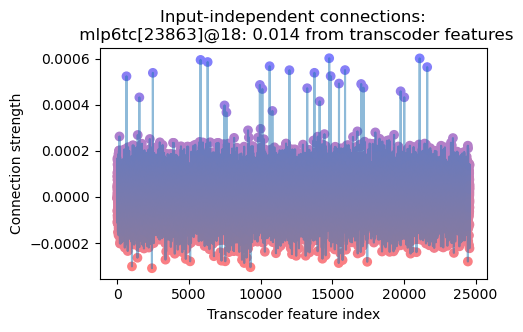

In [122]:
display_transcoder_pullback_features(model, subcircuit[3][-1], transcoders[0])

In [124]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 21096, k=5)

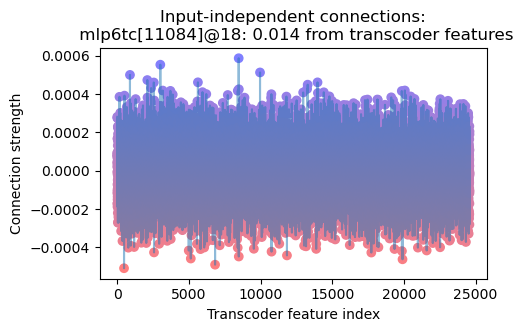

In [125]:
display_transcoder_pullback_features(model, subcircuit[4][-1], transcoders[0])

In [129]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 8471, k=5)

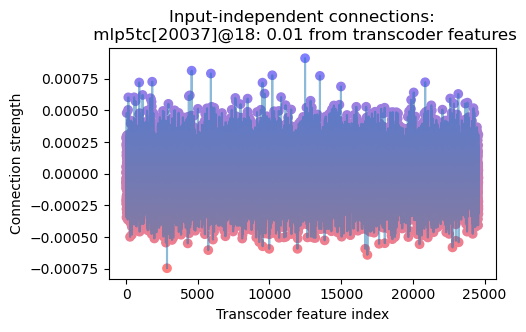

In [133]:
display_transcoder_pullback_features(model, subcircuit[9][-1], transcoders[0])

In [137]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 5912, k=5)

Yeah, attention isn't helping here. I'll do one more input and see if we get any further.

## Input 9674, 42

In [93]:
prompt = owt_tokens_torch[9674, :42+1]
_, cache = model.run_with_cache(prompt)

In [105]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=30)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[9030]@-1: 6.4 <- attn5[10]@42: 0.3
Path [1]: mlp8tc[9030]@-1: 6.4 <- mlp6tc[12258]@42: 0.28
Path [2]: mlp8tc[9030]@-1: 6.4 <- mlp6tc[24414]@42: 0.28
Path [3]: mlp8tc[9030]@-1: 6.4 <- mlp7tc[17523]@42: 0.27
Path [4]: mlp8tc[9030]@-1: 6.4 <- attn7[0]@41: 0.24
Path [5]: mlp8tc[9030]@-1: 6.4 <- mlp3tc[5714]@42: 0.24
Path [6]: mlp8tc[9030]@-1: 6.4 <- mlp2tc[12687]@42: 0.23
Path [7]: mlp8tc[9030]@-1: 6.4 <- attn8[7]@41: 0.2
Path [8]: mlp8tc[9030]@-1: 6.4 <- attn3[0]@42: 0.19
Path [9]: mlp8tc[9030]@-1: 6.4 <- mlp7tc[16137]@42: 0.17
Path [10]: mlp8tc[9030]@-1: 6.4 <- mlp7tc[10673]@42: 0.15
Path [11]: mlp8tc[9030]@-1: 6.4 <- mlp7tc[15263]@42: 0.15
Path [12]: mlp8tc[9030]@-1: 6.4 <- attn8[9]@42: 0.14
Path [13]: mlp8tc[9030]@-1: 6.4 <- mlp7tc[2084]@42: 0.14
Path [14]: mlp8tc[9030]@-1: 6.4 <- mlp7tc[14379]@42: 0.14
Path [15]: mlp8tc[9030]@-1: 6.4 <- mlp1tc[11577]@42: 0.13
Path [16]: mlp8tc[9030]@-1: 6.4 <- attn2[9]@42: 0.12
Path [17]: mlp8tc[9030]@-1: 6.4 <- mlp1tc[8043]@42: 0.12


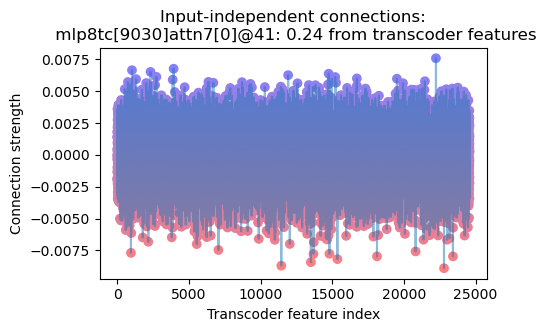

In [102]:
display_transcoder_pullback_features(model, all_paths[4][-1], transcoders[0])

In [103]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 22230, k=5)

In [106]:
subcircuit = greedy_get_top_paths(model, transcoders, cache, all_paths[4][-1], num_iters=6, num_branches=30)
subcircuit = get_paths_via_filter(subcircuit, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE, token_filter_type=FilterType.LT, token=42)])
print_all_paths(subcircuit)

Path [0]: attn7[0]@41: 0.24 <- mlp4tc[4172]@41: 0.033
Path [1]: attn7[0]@41: 0.24 <- attn6[4]@26: 0.018
Path [2]: attn7[0]@41: 0.24 <- attn4[6]@40: 0.014
Path [3]: attn7[0]@41: 0.24 <- mlp4tc[789]@41: 0.013
Path [4]: attn7[0]@41: 0.24 <- mlp6tc[21151]@41: 0.012
Path [5]: attn7[0]@41: 0.24 <- mlp6tc[16703]@41: 0.012
Path [6]: attn7[0]@41: 0.24 <- attn4[11]@40: 0.011
Path [7]: attn7[0]@41: 0.24 <- mlp5tc[4096]@41: 0.011
Path [8]: attn7[0]@41: 0.24 <- mlp1tc[19498]@41: 0.01
Path [9]: attn7[0]@41: 0.24 <- mlp5tc[8487]@41: 0.01
Path [10]: attn7[0]@41: 0.24 <- attn5[4]@40: 0.01
Path [11]: attn7[0]@41: 0.24 <- attn3[11]@39: 0.0096
Path [12]: attn7[0]@41: 0.24 <- mlp3tc[23554]@41: 0.0093
Path [13]: attn7[0]@41: 0.24 <- mlp5tc[22742]@41: 0.0092
Path [14]: attn7[0]@41: 0.24 <- attn2[8]@40: 0.0083
Path [15]: attn7[0]@41: 0.24 <- attn3[10]@41: 0.0083
Path [16]: attn7[0]@41: 0.24 <- attn4[6]@39: 0.0083
Path [17]: attn7[0]@41: 0.24 <- mlp5tc[3168]@41: 0.0082
Path [18]: attn7[0]@41: 0.24 <- mlp2tc[11

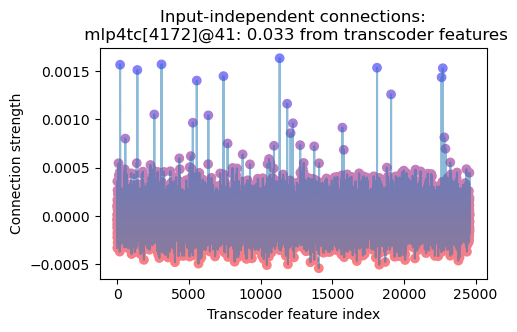

In [107]:
display_transcoder_pullback_features(model, subcircuit[0][-1], transcoders[0])

In [110]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 198, k=5)

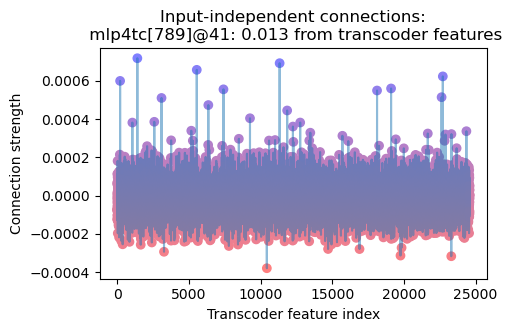

In [111]:
display_transcoder_pullback_features(model, subcircuit[3][-1], transcoders[0])

In [112]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 1401, k=5)

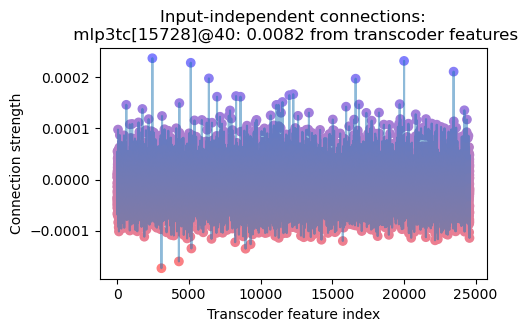

In [113]:
display_transcoder_pullback_features(model, subcircuit[27][-1], transcoders[0])

In [115]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 20008, k=5)

## Moment of truth

Main guess: feature fires on token `biology`. (Maybe also `sociology`?) Previous tokens are harder to reason about. The previous token in a couple of examples seemed like it might be `them` or `their`; in another example, it seemed like it might be `one`. Maybe this suggests that it fires on "teach them biology"?

**FINAL HYPOTHESIS**: "biology", when referring to the subject in general (i.e. not on "the organisms had a strange biology")

In [138]:
display_activating_examples_dash(model, owt_tokens_torch[:128*100], scores, window_size=7)

**Failure**: although "biology" does show up (in the context of the subject), a ton other subjects related to it show up too.

# Blind case study: `live_features[4242]`


In [139]:
feature_idx = live_features[4242]
my_feature = make_sae_feature_vector(transcoders[8], feature_idx, use_encoder=True, token=-1)
print(my_feature)

mlp8tc[4911]@-1


In [140]:
# get scores
scores = get_feature_scores(model, transcoders[8], owt_tokens_torch[:128*100], feature_idx, batch_size=128, use_raw_scores=False)
uniform_samples = sample_uniform(scores, num_samples=50)

100%|██████████| 100/100 [00:24<00:00,  4.08it/s]


Let's get the indices of sufficiently-highly activating examples.

In [141]:
uniform_scores, uniform_idxs = uniform_samples[0], uniform_samples[1]
print(uniform_scores)

[ 0.      0.3616  0.725   1.081   1.442   1.804   2.17    2.53    2.89
  3.25    3.574   3.96    4.32    4.67    5.074   5.195   5.777   6.04
  6.64    6.934   7.19    7.57    7.883   8.336   8.625   9.016   9.41
  9.72   10.14   10.48   10.81   11.164  11.52   11.92   12.26   12.64
 13.     13.35   13.72   14.11   14.45   14.8    15.11   15.35   15.7
 17.67  ]


In [142]:
threshold = 14.11
uniform_idxs = uniform_idxs[uniform_scores>threshold]
uniform_scores = uniform_scores[uniform_scores>threshold]
for x in uniform_idxs: print(f'{x[0]}, {x[1]}')

7833, 35
7100, 124
11200, 88
8901, 121
9406, 110
1840, 93


## Input 7833, 35

In [143]:
prompt = owt_tokens_torch[7833, :35+1]
_, cache = model.run_with_cache(prompt)

In [144]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[4911]@-1: 1.4e+01 <- mlp7tc[10064]@35: 1.9
Path [1]: mlp8tc[4911]@-1: 1.4e+01 <- mlp5tc[23580]@35: 1.4
Path [2]: mlp8tc[4911]@-1: 1.4e+01 <- mlp3tc[10354]@35: 1.2
Path [3]: mlp8tc[4911]@-1: 1.4e+01 <- mlp6tc[7599]@35: 1.2
Path [4]: mlp8tc[4911]@-1: 1.4e+01 <- mlp2tc[18563]@35: 1.2
Path [5]: mlp8tc[4911]@-1: 1.4e+01 <- mlp4tc[3307]@35: 1.0
Path [6]: mlp8tc[4911]@-1: 1.4e+01 <- attn7[9]@35: 0.99
Path [7]: mlp8tc[4911]@-1: 1.4e+01 <- mlp6tc[14576]@35: 0.88
Path [8]: mlp8tc[4911]@-1: 1.4e+01 <- mlp1tc[19423]@35: 0.73
Path [9]: mlp8tc[4911]@-1: 1.4e+01 <- mlp1tc[4655]@35: 0.66
Path [10]: mlp8tc[4911]@-1: 1.4e+01 <- mlp3tc[20965]@35: 0.47
Path [11]: mlp8tc[4911]@-1: 1.4e+01 <- mlp5tc[19994]@35: 0.39
Path [12]: mlp8tc[4911]@-1: 1.4e+01 <- attn4[1]@35: 0.37
Path [13]: mlp8tc[4911]@-1: 1.4e+01 <- mlp4tc[8654]@35: 0.36
Path [14]: mlp8tc[4911]@-1: 1.4e+01 <- mlp3tc[20965]@35: 0.47 <- mlp2tc[18563]@35: 0.47


All from last token, huh.

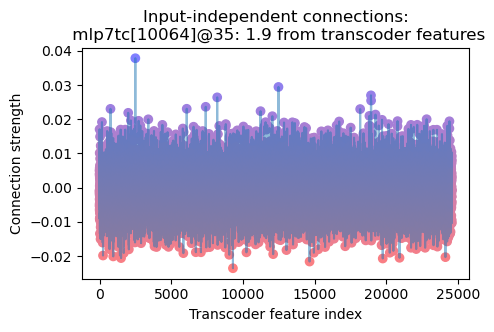

In [146]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [149]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 18937, k=5)

So far, seems like current token is "though" or "although".

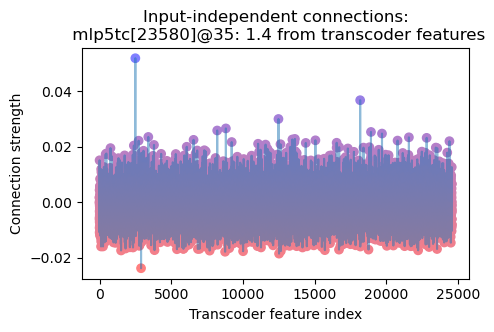

In [150]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [151]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 2499, k=5)

Maybe "although" is the one.

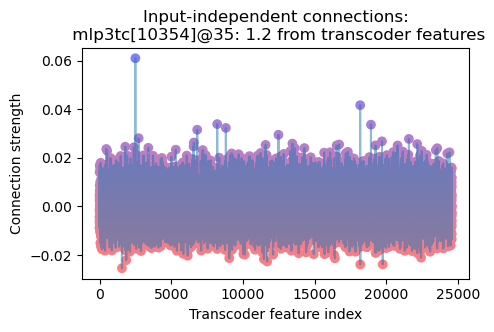

In [152]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

## Input 1840, 93

In [153]:
prompt = owt_tokens_torch[1840, :93+1]
_, cache = model.run_with_cache(prompt)

In [154]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[4911]@-1: 1.8e+01 <- mlp7tc[10064]@93: 2.0
Path [1]: mlp8tc[4911]@-1: 1.8e+01 <- mlp3tc[20965]@93: 1.7
Path [2]: mlp8tc[4911]@-1: 1.8e+01 <- mlp5tc[19994]@93: 1.6
Path [3]: mlp8tc[4911]@-1: 1.8e+01 <- mlp1tc[19423]@93: 1.5
Path [4]: mlp8tc[4911]@-1: 1.8e+01 <- mlp4tc[8654]@93: 1.3
Path [5]: mlp8tc[4911]@-1: 1.8e+01 <- mlp6tc[14576]@93: 1.3
Path [6]: mlp8tc[4911]@-1: 1.8e+01 <- mlp2tc[15713]@93: 1.2
Path [7]: mlp8tc[4911]@-1: 1.8e+01 <- mlp6tc[19520]@93: 1.1
Path [8]: mlp8tc[4911]@-1: 1.8e+01 <- mlp7tc[8376]@93: 0.59
Path [9]: mlp8tc[4911]@-1: 1.8e+01 <- mlp4tc[21641]@93: 0.44
Path [10]: mlp8tc[4911]@-1: 1.8e+01 <- mlp5tc[4991]@93: 0.39
Path [11]: mlp8tc[4911]@-1: 1.8e+01 <- attn7[9]@93: 0.34
Path [12]: mlp8tc[4911]@-1: 1.8e+01 <- attn2[5]@92: 0.33
Path [13]: mlp8tc[4911]@-1: 1.8e+01 <- attn3[1]@92: 0.33
Path [14]: mlp8tc[4911]@-1: 1.8e+01 <- mlp5tc[4353]@93: 0.33
Path [15]: mlp8tc[4911]@-1: 1.8e+01 <- mlp3tc[20965]@93: 1.7 <- mlp2tc[15713]@93: 0.81
Path [16]: mlp8tc[49

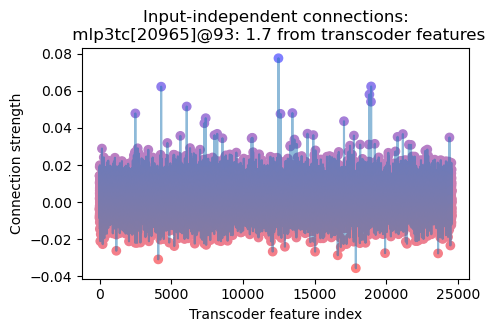

In [155]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [157]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 18946, k=5)

This one seems like it fires on `though`.

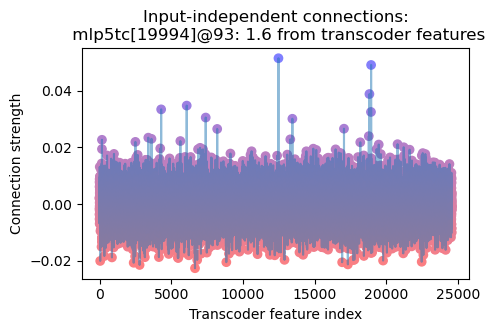

In [158]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

In [157]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 18946, k=5)

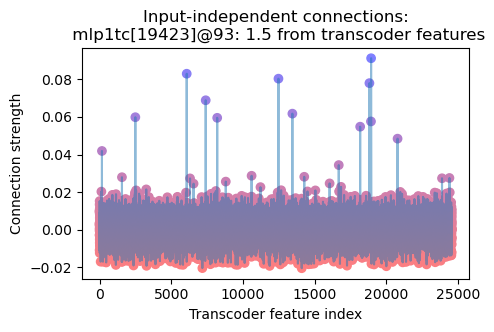

In [159]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

Any contributions from previous tokens?

In [162]:
subcircuit = greedy_get_top_paths(model, transcoders, cache, all_paths[12][-1], num_iters=6, num_branches=20)
subcircuit = get_paths_via_filter(subcircuit, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(subcircuit)

Path [0]: attn2[5]@92: 0.33 <- mlp1tc[5661]@92: 0.086
Path [1]: attn2[5]@92: 0.33 <- attn1[1]@91: 0.023
Path [2]: attn2[5]@92: 0.33 <- mlp1tc[15099]@92: 0.02
Path [3]: attn2[5]@92: 0.33 <- mlp1tc[5720]@92: 0.019
Path [4]: attn2[5]@92: 0.33 <- attn1[0]@90: 0.0082
Path [5]: attn2[5]@92: 0.33 <- attn1[1]@88: 0.0062
Path [6]: attn2[5]@92: 0.33 <- attn1[0]@92: 0.005
Path [7]: attn2[5]@92: 0.33 <- mlp1tc[5661]@92: 0.086 <- attn1[11]@92: 0.046
Path [8]: attn2[5]@92: 0.33 <- mlp1tc[15099]@92: 0.02 <- attn1[11]@92: 0.02


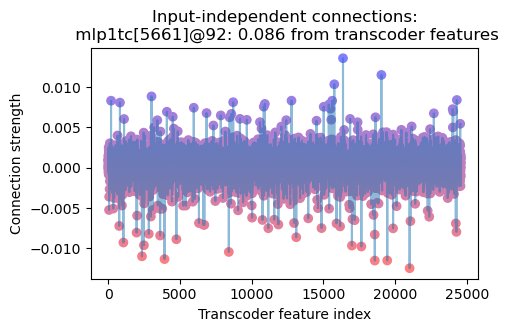

In [163]:
display_transcoder_pullback_features(model, subcircuit[0][-1], transcoders[0])

In [165]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 19045, k=5)

Dash!

**Current hypothesis**: " -- though"

## Input 9406, 110

In [166]:
prompt = owt_tokens_torch[9406, :110+1]
_, cache = model.run_with_cache(prompt)

In [167]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[4911]@-1: 1.6e+01 <- mlp7tc[10064]@110: 2.4
Path [1]: mlp8tc[4911]@-1: 1.6e+01 <- mlp5tc[23580]@110: 1.6
Path [2]: mlp8tc[4911]@-1: 1.6e+01 <- mlp3tc[10354]@110: 1.3
Path [3]: mlp8tc[4911]@-1: 1.6e+01 <- mlp6tc[14576]@110: 1.3
Path [4]: mlp8tc[4911]@-1: 1.6e+01 <- mlp6tc[7599]@110: 1.3
Path [5]: mlp8tc[4911]@-1: 1.6e+01 <- mlp4tc[3307]@110: 1.2
Path [6]: mlp8tc[4911]@-1: 1.6e+01 <- mlp2tc[18563]@110: 1.2
Path [7]: mlp8tc[4911]@-1: 1.6e+01 <- mlp3tc[20965]@110: 0.91
Path [8]: mlp8tc[4911]@-1: 1.6e+01 <- attn7[9]@110: 0.86
Path [9]: mlp8tc[4911]@-1: 1.6e+01 <- attn4[1]@110: 0.71
Path [10]: mlp8tc[4911]@-1: 1.6e+01 <- mlp1tc[19423]@110: 0.71
Path [11]: mlp8tc[4911]@-1: 1.6e+01 <- mlp1tc[4655]@110: 0.67
Path [12]: mlp8tc[4911]@-1: 1.6e+01 <- mlp4tc[8654]@110: 0.55
Path [13]: mlp8tc[4911]@-1: 1.6e+01 <- mlp5tc[19994]@110: 0.4
Path [14]: mlp8tc[4911]@-1: 1.6e+01 <- attn6[1]@100: 0.39
Path [15]: mlp8tc[4911]@-1: 1.6e+01 <- mlp3tc[20965]@110: 0.91 <- mlp2tc[18563]@110: 0.53


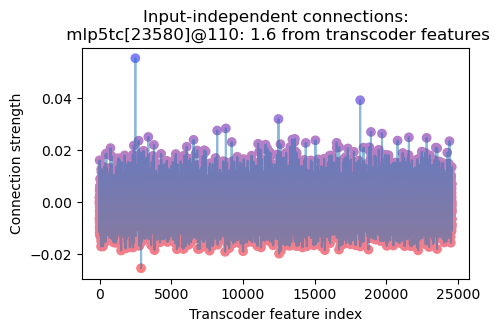

In [168]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [169]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 2499, k=5)

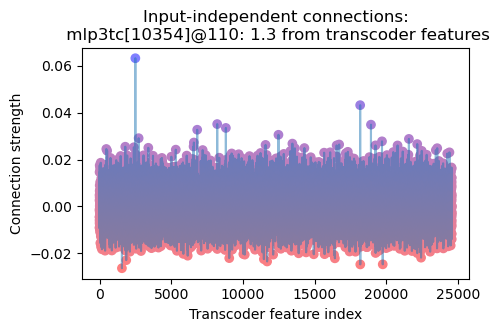

In [170]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

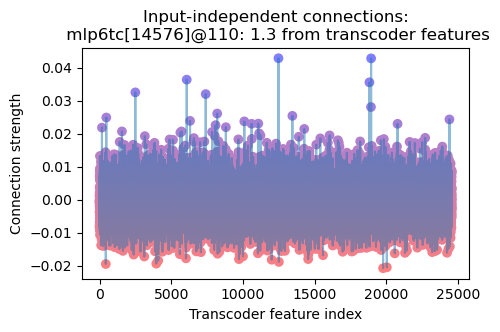

In [171]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

In [176]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=30)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE, token=110, token_filter_type=FilterType.LT)])
print_all_paths(all_paths)

Path [0]: mlp8tc[4911]@-1: 1.6e+01 <- attn6[1]@100: 0.39
Path [1]: mlp8tc[4911]@-1: 1.6e+01 <- attn6[3]@100: 0.24


This one seems to be firing on `although`.

**Current hypothesis**: `though` or `although` at beginning of clause.

## Moment of truth

**FINAL HYPOTHESIS**: `though` or `although` at beginning of clause

In [177]:
display_activating_examples_dash(model, owt_tokens_torch[:128*100], scores, window_size=7)

Success.

# Blind case study: `live_features[5555]`


In [178]:
feature_idx = live_features[5555]
my_feature = make_sae_feature_vector(transcoders[8], feature_idx, use_encoder=True, token=-1)
print(my_feature)

mlp8tc[6414]@-1


In [179]:
# get scores
scores = get_feature_scores(model, transcoders[8], owt_tokens_torch[:128*100], feature_idx, batch_size=128, use_raw_scores=False)
uniform_samples = sample_uniform(scores, num_samples=50)

100%|██████████| 100/100 [00:24<00:00,  4.07it/s]


Let's get the indices of sufficiently-highly activating examples.

In [180]:
uniform_scores, uniform_idxs = uniform_samples[0], uniform_samples[1]
print(uniform_scores)

[0.     0.1432 0.2864 0.4294 0.5728 0.716  0.859  1.002  1.1455 1.289
 1.432  1.575  1.718  1.861  2.004  2.148  2.291  2.434  2.58   2.72
 2.863  3.006  3.15   3.293  3.436  3.576  3.723  3.867  4.008  4.15
 4.297  4.438  4.582  4.727  4.867  5.01   5.156  5.297  5.438  5.582
 5.727  5.87   6.008  6.15   6.332  6.387  6.52   6.824  6.855  7.016 ]


In [181]:
threshold = 6
uniform_idxs = uniform_idxs[uniform_scores>threshold]
uniform_scores = uniform_scores[uniform_scores>threshold]
for x in uniform_idxs: print(f'{x[0]}, {x[1]}')

12000, 30
5988, 94
5988, 82
5286, 118
11019, 46
5467, 64
2562, 78
5988, 109


## Input 5988, 109

In [182]:
prompt = owt_tokens_torch[5988, :109+1]
_, cache = model.run_with_cache(prompt)

In [183]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[6414]@-1: 7.0 <- mlp7tc[10656]@109: 0.29
Path [1]: mlp8tc[6414]@-1: 7.0 <- attn5[6]@108: 0.23
Path [2]: mlp8tc[6414]@-1: 7.0 <- attn3[3]@108: 0.23
Path [3]: mlp8tc[6414]@-1: 7.0 <- mlp6tc[9116]@109: 0.21
Path [4]: mlp8tc[6414]@-1: 7.0 <- mlp6tc[23888]@109: 0.2
Path [5]: mlp8tc[6414]@-1: 7.0 <- mlp5tc[1677]@109: 0.16
Path [6]: mlp8tc[6414]@-1: 7.0 <- mlp7tc[11441]@109: 0.15
Path [7]: mlp8tc[6414]@-1: 7.0 <- attn7[0]@107: 0.14
Path [8]: mlp8tc[6414]@-1: 7.0 <- mlp5tc[5434]@109: 0.14
Path [9]: mlp8tc[6414]@-1: 7.0 <- mlp1tc[1773]@109: 0.14
Path [10]: mlp8tc[6414]@-1: 7.0 <- mlp4tc[17797]@109: 0.14
Path [11]: mlp8tc[6414]@-1: 7.0 <- mlp5tc[10050]@109: 0.13
Path [12]: mlp8tc[6414]@-1: 7.0 <- mlp2tc[21707]@109: 0.12
Path [13]: mlp8tc[6414]@-1: 7.0 <- mlp3tc[22635]@109: 0.12
Path [14]: mlp8tc[6414]@-1: 7.0 <- mlp6tc[23888]@109: 0.2 <- attn5[6]@108: 0.056


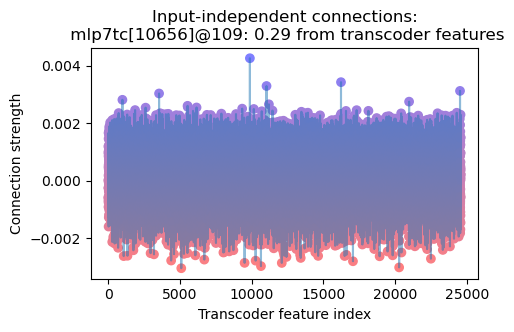

In [184]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [187]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 9871, k=5)

Cyrillic?!

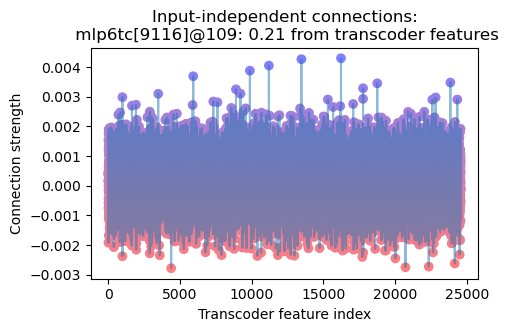

In [192]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

In [195]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 16227, k=5)

Arabic!?!

In [196]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 13464, k=5)

Japanese?!?!

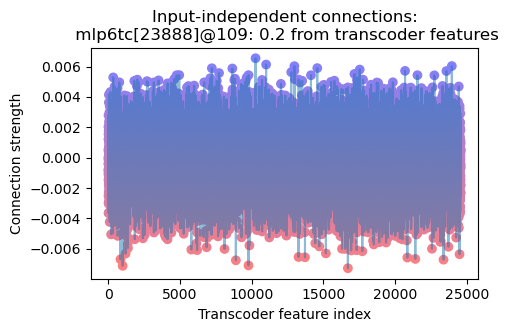

In [197]:
display_transcoder_pullback_features(model, all_paths[4][-1], transcoders[0])

In [201]:
subcircuit = greedy_get_top_paths(model, transcoders, cache, all_paths[1][-1], num_iters=6, num_branches=20)
subcircuit = get_paths_via_filter(subcircuit, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(subcircuit)

Path [0]: attn5[6]@108: 0.23 <- mlp4tc[15332]@108: 0.034
Path [1]: attn5[6]@108: 0.23 <- mlp3tc[295]@108: 0.02
Path [2]: attn5[6]@108: 0.23 <- mlp1tc[21475]@108: 0.019
Path [3]: attn5[6]@108: 0.23 <- mlp1tc[1269]@108: 0.018
Path [4]: attn5[6]@108: 0.23 <- mlp1tc[3784]@108: 0.012
Path [5]: attn5[6]@108: 0.23 <- mlp1tc[7004]@108: 0.011
Path [6]: attn5[6]@108: 0.23 <- attn3[7]@107: 0.0096
Path [7]: attn5[6]@108: 0.23 <- attn4[6]@108: 0.0094
Path [8]: attn5[6]@108: 0.23 <- attn3[11]@107: 0.009
Path [9]: attn5[6]@108: 0.23 <- attn4[6]@106: 0.0088
Path [10]: attn5[6]@108: 0.23 <- attn3[9]@107: 0.0082
Path [11]: attn5[6]@108: 0.23 <- attn2[3]@107: 0.0075
Path [12]: attn5[6]@108: 0.23 <- mlp1tc[21596]@108: 0.0069
Path [13]: attn5[6]@108: 0.23 <- mlp4tc[15332]@108: 0.034 <- attn4[11]@107: 0.0039


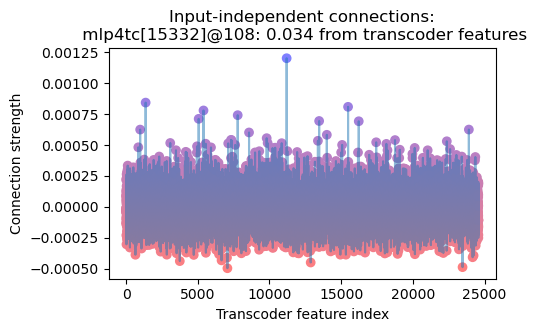

In [202]:
display_transcoder_pullback_features(model, subcircuit[0][-1], transcoders[0])

In [203]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 11197, k=5)

More Cyrillic. It feels safe to say that the current input is Cyrillic.

But the question remains: is the feature a "fires on Cyrillic" feature? Or a general "fires on non-Latin text" feature?

## Input 2562, 78

In [205]:
prompt = owt_tokens_torch[2562, :78+1]
_, cache = model.run_with_cache(prompt)

In [206]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[6414]@-1: 6.9 <- mlp6tc[18018]@78: 0.97
Path [1]: mlp8tc[6414]@-1: 6.9 <- mlp1tc[12768]@78: 0.67
Path [2]: mlp8tc[6414]@-1: 6.9 <- mlp7tc[10189]@78: 0.53
Path [3]: mlp8tc[6414]@-1: 6.9 <- mlp7tc[15518]@78: 0.52
Path [4]: mlp8tc[6414]@-1: 6.9 <- mlp5tc[13189]@78: 0.37
Path [5]: mlp8tc[6414]@-1: 6.9 <- attn2[4]@77: 0.25
Path [6]: mlp8tc[6414]@-1: 6.9 <- attn4[3]@76: 0.24
Path [7]: mlp8tc[6414]@-1: 6.9 <- attn8[8]@77: 0.24
Path [8]: mlp8tc[6414]@-1: 6.9 <- mlp4tc[11234]@78: 0.23
Path [9]: mlp8tc[6414]@-1: 6.9 <- mlp3tc[17326]@78: 0.22
Path [10]: mlp8tc[6414]@-1: 6.9 <- mlp5tc[2491]@78: 0.21
Path [11]: mlp8tc[6414]@-1: 6.9 <- mlp5tc[15723]@78: 0.2
Path [12]: mlp8tc[6414]@-1: 6.9 <- mlp2tc[8650]@78: 0.19
Path [13]: mlp8tc[6414]@-1: 6.9 <- attn1[11]@78: 0.18
Path [14]: mlp8tc[6414]@-1: 6.9 <- mlp5tc[16746]@78: 0.17


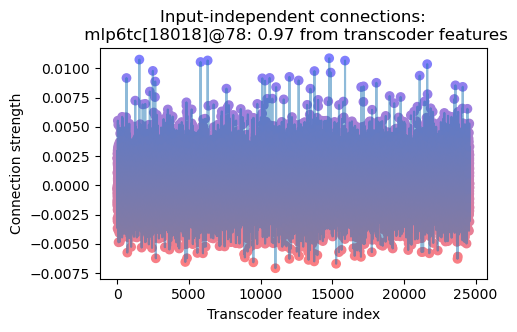

In [207]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [208]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 14785, k=5)

!?!

In [210]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 6306, k=5)

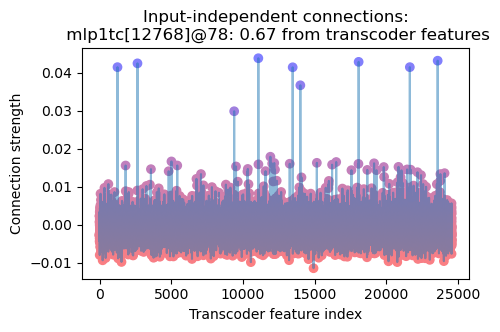

In [211]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [214]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 18077, k=5)

Now it's "very"?!

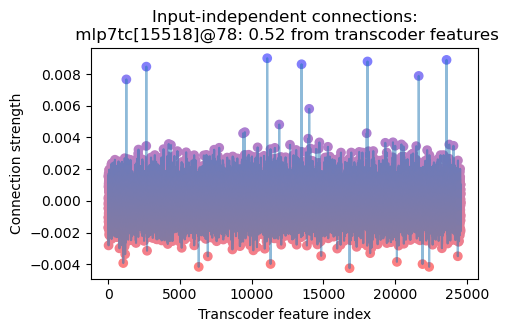

In [216]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

In [217]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 11080, k=5)

I'm starting to wonder if this is just an uninterpretable feature.

## Input 5467, 64

In [218]:
prompt = owt_tokens_torch[5467, :64+1]
_, cache = model.run_with_cache(prompt)

In [219]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[6414]@-1: 6.8 <- mlp6tc[9116]@64: 0.29
Path [1]: mlp8tc[6414]@-1: 6.8 <- mlp7tc[10656]@64: 0.27
Path [2]: mlp8tc[6414]@-1: 6.8 <- attn3[3]@63: 0.2
Path [3]: mlp8tc[6414]@-1: 6.8 <- mlp6tc[23888]@64: 0.18
Path [4]: mlp8tc[6414]@-1: 6.8 <- mlp7tc[11441]@64: 0.17
Path [5]: mlp8tc[6414]@-1: 6.8 <- mlp5tc[5434]@64: 0.17
Path [6]: mlp8tc[6414]@-1: 6.8 <- mlp4tc[17797]@64: 0.16
Path [7]: mlp8tc[6414]@-1: 6.8 <- mlp7tc[4268]@64: 0.15
Path [8]: mlp8tc[6414]@-1: 6.8 <- attn6[8]@63: 0.15
Path [9]: mlp8tc[6414]@-1: 6.8 <- mlp1tc[1773]@64: 0.15
Path [10]: mlp8tc[6414]@-1: 6.8 <- mlp3tc[9068]@64: 0.13
Path [11]: mlp8tc[6414]@-1: 6.8 <- attn7[8]@63: 0.13
Path [12]: mlp8tc[6414]@-1: 6.8 <- mlp2tc[21707]@64: 0.13
Path [13]: mlp8tc[6414]@-1: 6.8 <- mlp5tc[10050]@64: 0.12
Path [14]: mlp8tc[6414]@-1: 6.8 <- mlp7tc[9558]@64: 0.12
Path [15]: mlp8tc[6414]@-1: 6.8 <- mlp5tc[1677]@64: 0.11
Path [16]: mlp8tc[6414]@-1: 6.8 <- mlp6tc[9116]@64: 0.29 <- attn6[8]@63: 0.053
Path [17]: mlp8tc[6414]@-1

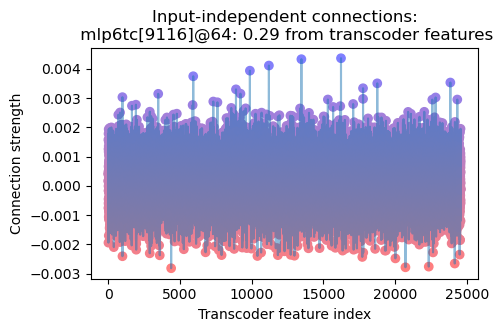

In [220]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [221]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 16227, k=5)

In [222]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 13464, k=5)

Phew, we're back to the non-Latin scripts again.

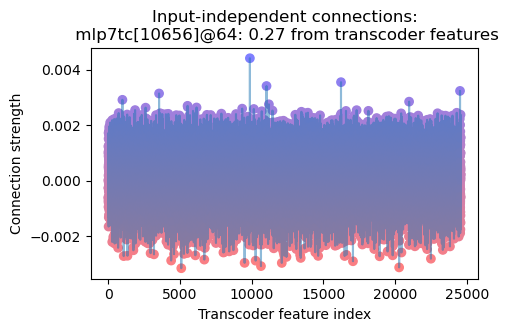

In [223]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [224]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 9871, k=5)

In [225]:
subcircuit = greedy_get_top_paths(model, transcoders, cache, all_paths[2][-1], num_iters=6, num_branches=20)
subcircuit = get_paths_via_filter(subcircuit, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(subcircuit)

Path [0]: attn3[3]@63: 0.2 <- mlp1tc[3784]@63: 0.01
Path [1]: attn3[3]@63: 0.2 <- mlp1tc[7004]@63: 0.0072
Path [2]: attn3[3]@63: 0.2 <- mlp1tc[21596]@63: 0.0069
Path [3]: attn3[3]@63: 0.2 <- mlp1tc[21475]@63: 0.0062
Path [4]: attn3[3]@63: 0.2 <- mlp1tc[8076]@63: 0.0043
Path [5]: attn3[3]@63: 0.2 <- attn2[4]@59: 0.0039


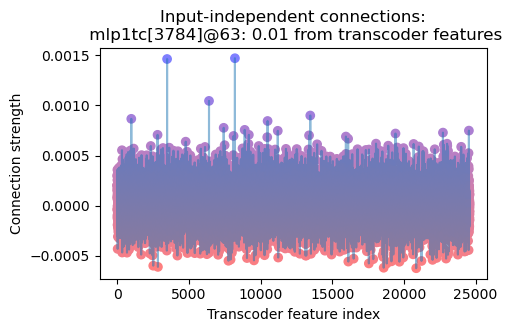

In [226]:
display_transcoder_pullback_features(model, subcircuit[0][-1], transcoders[0])

In [228]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 3476, k=5)

Cyrillic again....

## Input 11019, 46

In [229]:
prompt = owt_tokens_torch[11019, :46+1]
_, cache = model.run_with_cache(prompt)

In [230]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[6414]@-1: 6.5 <- mlp6tc[5826]@46: 0.75
Path [1]: mlp8tc[6414]@-1: 6.5 <- mlp4tc[8780]@46: 0.5
Path [2]: mlp8tc[6414]@-1: 6.5 <- mlp5tc[206]@46: 0.47
Path [3]: mlp8tc[6414]@-1: 6.5 <- mlp1tc[15747]@46: 0.47
Path [4]: mlp8tc[6414]@-1: 6.5 <- mlp3tc[189]@46: 0.36
Path [5]: mlp8tc[6414]@-1: 6.5 <- mlp3tc[4958]@46: 0.32
Path [6]: mlp8tc[6414]@-1: 6.5 <- attn1[11]@46: 0.26
Path [7]: mlp8tc[6414]@-1: 6.5 <- mlp2tc[9864]@46: 0.22
Path [8]: mlp8tc[6414]@-1: 6.5 <- attn5[2]@45: 0.13
Path [9]: mlp8tc[6414]@-1: 6.5 <- mlp5tc[21712]@46: 0.11
Path [10]: mlp8tc[6414]@-1: 6.5 <- mlp4tc[23805]@46: 0.1
Path [11]: mlp8tc[6414]@-1: 6.5 <- attn2[1]@25: 0.1
Path [12]: mlp8tc[6414]@-1: 6.5 <- attn2[2]@45: 0.1
Path [13]: mlp8tc[6414]@-1: 6.5 <- attn4[9]@42: 0.096
Path [14]: mlp8tc[6414]@-1: 6.5 <- attn5[6]@45: 0.093
Path [15]: mlp8tc[6414]@-1: 6.5 <- mlp5tc[15218]@46: 0.093
Path [16]: mlp8tc[6414]@-1: 6.5 <- mlp3tc[4958]@46: 0.32 <- mlp1tc[15747]@46: 0.15
Path [17]: mlp8tc[6414]@-1: 6.5 <- ml

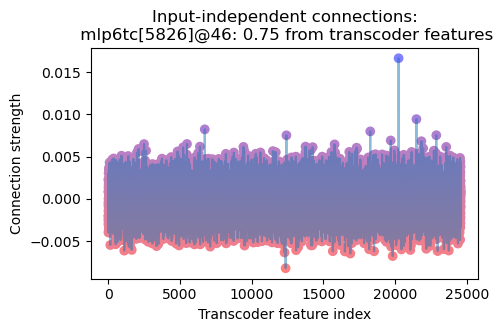

In [231]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [232]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 20244, k=5)

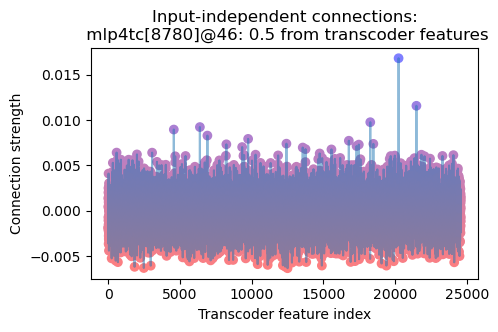

In [233]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

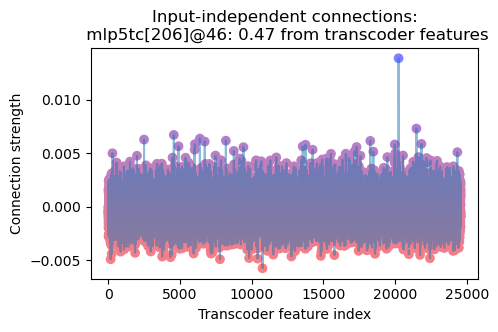

In [234]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

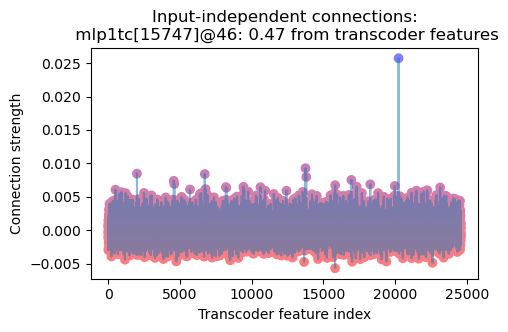

In [235]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

What the heck? This input seems to just be "solid".

## Moment of truth

**Final hypothesis**: uninterpretable. But Cyrillic shows up.

In [236]:
display_activating_examples_dash(model, owt_tokens_torch[:128*100], scores, window_size=7)

Success -- I guess?

# Blind case study: `live_features[2345]`


In [237]:
feature_idx = live_features[2345]
my_feature = make_sae_feature_vector(transcoders[8], feature_idx, use_encoder=True, token=-1)
print(my_feature)

mlp8tc[2725]@-1


In [238]:
# get scores
scores = get_feature_scores(model, transcoders[8], owt_tokens_torch[:128*100], feature_idx, batch_size=128, use_raw_scores=False)
uniform_samples = sample_uniform(scores, num_samples=50)

100%|██████████| 100/100 [00:24<00:00,  4.08it/s]


Let's get the indices of sufficiently-highly activating examples.

In [239]:
uniform_scores, uniform_idxs = uniform_samples[0], uniform_samples[1]
print(uniform_scores)

[0.     0.1304 0.2612 0.3918 0.5225 0.6533 0.784  0.9146 1.046  1.176
 1.307  1.4375 1.568  1.698  1.829  1.96   2.09   2.223  2.354  2.482
 2.615  2.746  2.877  3.008  3.143  3.266  3.396  3.527  3.662  3.79
 3.918  4.043  4.184  4.324  4.406  4.574  4.7    4.863  4.996  5.113
 5.242  5.35   5.477  5.594  5.668  5.887  6.125  6.348  6.402 ]


In [241]:
threshold = 5
uniform_idxs = uniform_idxs[uniform_scores>threshold]
uniform_scores = uniform_scores[uniform_scores>threshold]
for x in uniform_idxs: print(f'{x[0]}, {x[1]}')

8083, 94
8154, 20
11918, 37
12552, 27
7238, 96
8150, 119
1115, 49
1067, 43
6398, 16
10254, 109


## Input 10254, 109

In [242]:
prompt = owt_tokens_torch[10254, :109+1]
_, cache = model.run_with_cache(prompt)

In [243]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[2725]@-1: 6.4 <- attn8[5]@108: 0.6
Path [1]: mlp8tc[2725]@-1: 6.4 <- attn6[11]@108: 0.47
Path [2]: mlp8tc[2725]@-1: 6.4 <- attn1[0]@108: 0.38
Path [3]: mlp8tc[2725]@-1: 6.4 <- attn4[1]@108: 0.38
Path [4]: mlp8tc[2725]@-1: 6.4 <- attn3[11]@108: 0.37
Path [5]: mlp8tc[2725]@-1: 6.4 <- mlp7tc[197]@109: 0.37
Path [6]: mlp8tc[2725]@-1: 6.4 <- mlp4tc[19954]@109: 0.31
Path [7]: mlp8tc[2725]@-1: 6.4 <- attn5[10]@106: 0.25
Path [8]: mlp8tc[2725]@-1: 6.4 <- attn1[0]@107: 0.24
Path [9]: mlp8tc[2725]@-1: 6.4 <- attn4[3]@106: 0.24
Path [10]: mlp8tc[2725]@-1: 6.4 <- mlp3tc[14819]@109: 0.24
Path [11]: mlp8tc[2725]@-1: 6.4 <- mlp1tc[4424]@109: 0.22
Path [12]: mlp8tc[2725]@-1: 6.4 <- attn4[11]@108: 0.22
Path [13]: mlp8tc[2725]@-1: 6.4 <- mlp6tc[8130]@109: 0.2
Path [14]: mlp8tc[2725]@-1: 6.4 <- attn2[0]@108: 0.2
Path [15]: mlp8tc[2725]@-1: 6.4 <- mlp5tc[20285]@109: 0.2
Path [16]: mlp8tc[2725]@-1: 6.4 <- attn7[0]@108: 0.18
Path [17]: mlp8tc[2725]@-1: 6.4 <- mlp4tc[19954]@109: 0.31 <- attn

Okay, lots of contributions from previous tokens. Is this a local context feature, perchance? At any rate, it seems context-heavy.

But we'll start, as always, with the current token.

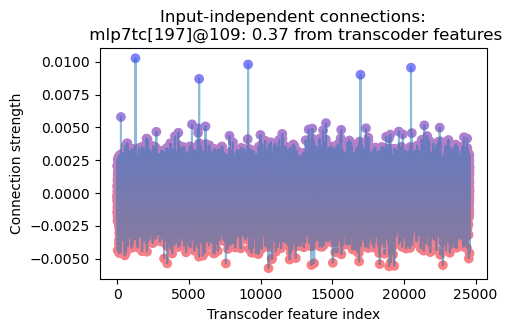

In [244]:
display_transcoder_pullback_features(model, all_paths[5][-1], transcoders[0])

In [245]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 1269, k=5)

In [246]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 9126, k=5)

Okay, "offer", probably as a verb. Seems reasonable.

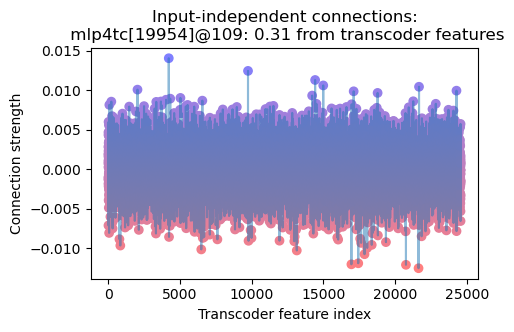

In [247]:
display_transcoder_pullback_features(model, all_paths[6][-1], transcoders[0])

In [248]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 4212, k=5)

In [249]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 9740, k=5)

This current-token feature, on the other hand, is far less reasonable.

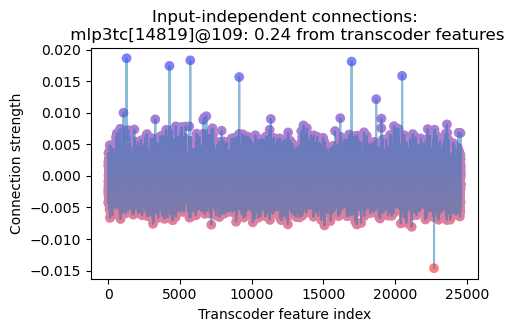

In [250]:
display_transcoder_pullback_features(model, all_paths[10][-1], transcoders[0])

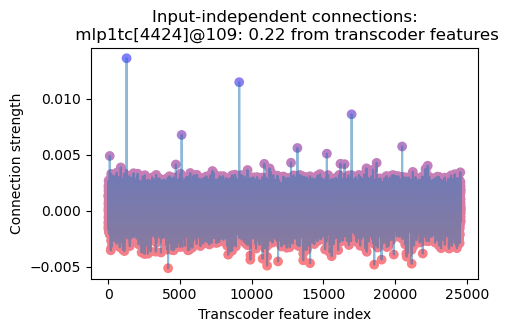

In [251]:
display_transcoder_pullback_features(model, all_paths[11][-1], transcoders[0])

Okay, current token is "offer". What about the rest of the context though?

In [262]:
subcircuit = greedy_get_top_paths(model, transcoders, cache, all_paths[0][-1], num_iters=6, num_branches=20)
subcircuit = get_paths_via_filter(subcircuit, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(subcircuit)

Path [0]: attn8[5]@108: 0.6 <- attn5[10]@106: 0.025
Path [1]: attn8[5]@108: 0.6 <- mlp1tc[5306]@108: 0.024
Path [2]: attn8[5]@108: 0.6 <- attn4[2]@100: 0.022
Path [3]: attn8[5]@108: 0.6 <- attn7[9]@102: 0.022
Path [4]: attn8[5]@108: 0.6 <- attn4[3]@106: 0.018
Path [5]: attn8[5]@108: 0.6 <- mlp4tc[5793]@108: 0.018
Path [6]: attn8[5]@108: 0.6 <- mlp7tc[7450]@108: 0.018
Path [7]: attn8[5]@108: 0.6 <- mlp7tc[21206]@108: 0.017
Path [8]: attn8[5]@108: 0.6 <- mlp4tc[3335]@108: 0.014
Path [9]: attn8[5]@108: 0.6 <- mlp3tc[22394]@108: 0.012
Path [10]: attn8[5]@108: 0.6 <- mlp7tc[2796]@108: 0.012
Path [11]: attn8[5]@108: 0.6 <- mlp7tc[11536]@108: 0.011
Path [12]: attn8[5]@108: 0.6 <- attn6[7]@105: 0.011
Path [13]: attn8[5]@108: 0.6 <- attn6[0]@106: 0.0096
Path [14]: attn8[5]@108: 0.6 <- attn7[8]@106: 0.0094
Path [15]: attn8[5]@108: 0.6 <- mlp4tc[20693]@108: 0.0082
Path [16]: attn8[5]@108: 0.6 <- attn4[2]@101: 0.0081
Path [17]: attn8[5]@108: 0.6 <- mlp1tc[5306]@108: 0.024 <- attn1[0]@107: 0.012
Pa

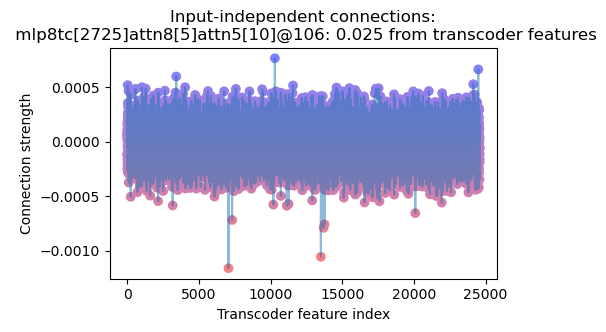

In [254]:
display_transcoder_pullback_features(model, subcircuit[0][-1], transcoders[0])

In [257]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 24484, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 10296, k=5)

Just an empty space....

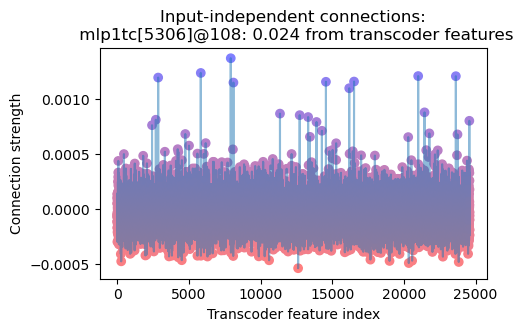

In [263]:
display_transcoder_pullback_features(model, subcircuit[1][-1], transcoders[0])

In [264]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 7917, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 5826, k=5)

"not", okay.

How about token 107?

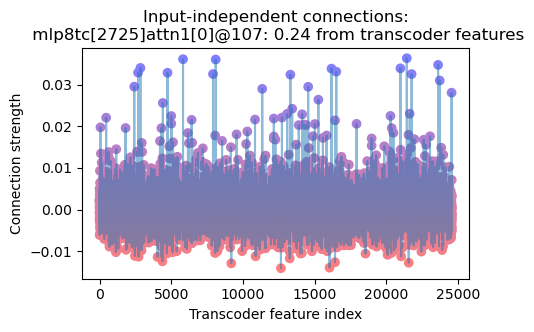

In [259]:
display_transcoder_pullback_features(model, all_paths[8][-1], transcoders[0])

In [260]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 21436, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 5826, k=5)

Wait -- wasn't "not" supposed to be token 108, not 107?

In [272]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=30)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE, token=108, token_filter_type=FilterType.LE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[2725]@-1: 6.4 <- attn8[5]@108: 0.6
Path [1]: mlp8tc[2725]@-1: 6.4 <- attn6[11]@108: 0.47
Path [2]: mlp8tc[2725]@-1: 6.4 <- attn1[0]@108: 0.38
Path [3]: mlp8tc[2725]@-1: 6.4 <- attn4[1]@108: 0.38
Path [4]: mlp8tc[2725]@-1: 6.4 <- attn3[11]@108: 0.37
Path [5]: mlp8tc[2725]@-1: 6.4 <- attn5[10]@106: 0.25
Path [6]: mlp8tc[2725]@-1: 6.4 <- attn1[0]@107: 0.24
Path [7]: mlp8tc[2725]@-1: 6.4 <- attn4[3]@106: 0.24
Path [8]: mlp8tc[2725]@-1: 6.4 <- attn4[11]@108: 0.22
Path [9]: mlp8tc[2725]@-1: 6.4 <- attn2[0]@108: 0.2
Path [10]: mlp8tc[2725]@-1: 6.4 <- attn7[0]@108: 0.18
Path [11]: mlp8tc[2725]@-1: 6.4 <- attn5[3]@108: 0.18
Path [12]: mlp8tc[2725]@-1: 6.4 <- attn4[9]@108: 0.16
Path [13]: mlp8tc[2725]@-1: 6.4 <- mlp4tc[19954]@109: 0.31 <- attn4[3]@106: 0.17
Path [14]: mlp8tc[2725]@-1: 6.4 <- attn3[11]@108: 0.37 <- mlp1tc[5306]@108: 0.089


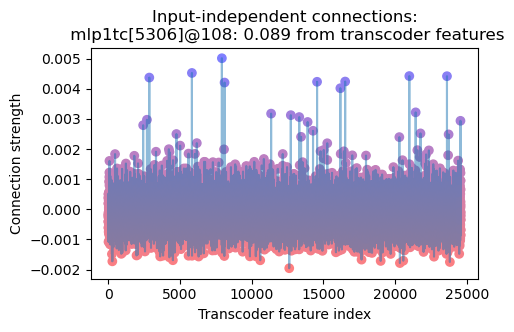

In [273]:
display_transcoder_pullback_features(model, all_paths[14][-1], transcoders[0])

In [269]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 7917, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 5826, k=5)

??

## Input 6398, 16

In [274]:
prompt = owt_tokens_torch[6398, :16+1]
_, cache = model.run_with_cache(prompt)

In [275]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[2725]@-1: 6.3 <- attn1[0]@14: 0.53
Path [1]: mlp8tc[2725]@-1: 6.3 <- attn6[11]@15: 0.45
Path [2]: mlp8tc[2725]@-1: 6.3 <- mlp7tc[197]@16: 0.41
Path [3]: mlp8tc[2725]@-1: 6.3 <- attn8[5]@15: 0.4
Path [4]: mlp8tc[2725]@-1: 6.3 <- attn5[6]@15: 0.24
Path [5]: mlp8tc[2725]@-1: 6.3 <- attn8[5]@16: 0.24
Path [6]: mlp8tc[2725]@-1: 6.3 <- mlp1tc[4424]@16: 0.24
Path [7]: mlp8tc[2725]@-1: 6.3 <- mlp6tc[15329]@16: 0.21
Path [8]: mlp8tc[2725]@-1: 6.3 <- attn4[11]@15: 0.2
Path [9]: mlp8tc[2725]@-1: 6.3 <- attn1[0]@15: 0.2
Path [10]: mlp8tc[2725]@-1: 6.3 <- attn5[3]@15: 0.19
Path [11]: mlp8tc[2725]@-1: 6.3 <- attn3[11]@15: 0.19
Path [12]: mlp8tc[2725]@-1: 6.3 <- mlp5tc[12169]@16: 0.19
Path [13]: mlp8tc[2725]@-1: 6.3 <- attn4[1]@15: 0.19
Path [14]: mlp8tc[2725]@-1: 6.3 <- attn5[3]@14: 0.18
Path [15]: mlp8tc[2725]@-1: 6.3 <- mlp3tc[20067]@16: 0.17
Path [16]: mlp8tc[2725]@-1: 6.3 <- mlp4tc[19954]@16: 0.17
Path [17]: mlp8tc[2725]@-1: 6.3 <- mlp6tc[8130]@16: 0.17
Path [18]: mlp8tc[2725]@-

Yet again, contributions from context.

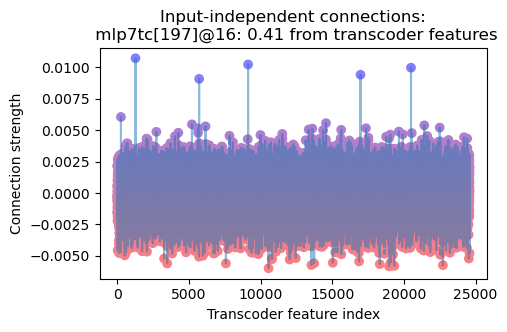

In [276]:
display_transcoder_pullback_features(model, all_paths[2][-1], transcoders[0])

In [277]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 1269, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 9126, k=5)

Yet again, current token is "offer".

In [280]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=40)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE, token=16, token_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[2725]@-1: 6.3 <- attn1[0]@14: 0.53
Path [1]: mlp8tc[2725]@-1: 6.3 <- attn6[11]@15: 0.45
Path [2]: mlp8tc[2725]@-1: 6.3 <- attn8[5]@15: 0.4
Path [3]: mlp8tc[2725]@-1: 6.3 <- attn5[6]@15: 0.24
Path [4]: mlp8tc[2725]@-1: 6.3 <- attn4[11]@15: 0.2
Path [5]: mlp8tc[2725]@-1: 6.3 <- attn1[0]@15: 0.2
Path [6]: mlp8tc[2725]@-1: 6.3 <- attn5[3]@15: 0.19
Path [7]: mlp8tc[2725]@-1: 6.3 <- attn3[11]@15: 0.19
Path [8]: mlp8tc[2725]@-1: 6.3 <- attn4[1]@15: 0.19
Path [9]: mlp8tc[2725]@-1: 6.3 <- attn5[3]@14: 0.18
Path [10]: mlp8tc[2725]@-1: 6.3 <- attn8[5]@14: 0.17
Path [11]: mlp8tc[2725]@-1: 6.3 <- attn3[6]@13: 0.16
Path [12]: mlp8tc[2725]@-1: 6.3 <- attn2[9]@13: 0.16
Path [13]: mlp8tc[2725]@-1: 6.3 <- attn4[9]@15: 0.15
Path [14]: mlp8tc[2725]@-1: 6.3 <- attn3[11]@14: 0.13
Path [15]: mlp8tc[2725]@-1: 6.3 <- attn4[3]@13: 0.13
Path [16]: mlp8tc[2725]@-1: 6.3 <- attn6[11]@14: 0.13
Path [17]: mlp8tc[2725]@-1: 6.3 <- attn2[0]@15: 0.12
Path [18]: mlp8tc[2725]@-1: 6.3 <- attn4[1]@14: 0.11
P

Huh, no non-layer-0 transcoder features show up in the context. That's annoying. 

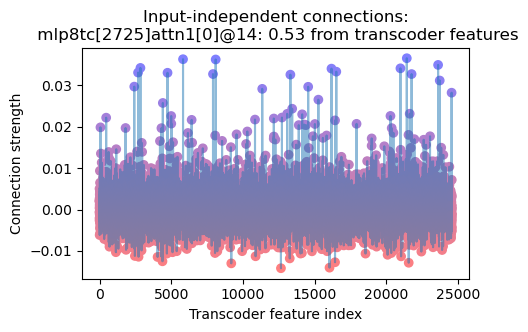

In [281]:
display_transcoder_pullback_features(model, all_paths[0][-1], transcoders[0])

In [282]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 21436, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 5826, k=5)

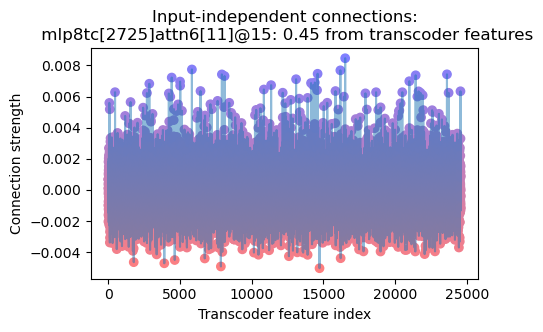

In [283]:
display_transcoder_pullback_features(model, all_paths[1][-1], transcoders[0])

In [285]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 16518, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 16182, k=5)

Once again, it's unclear whether the previous token or the antepenultimate token is "not". I'm hypothesizing the latter.

Note that I just looked it up, and "not an offer" is a common clause to find in legal contracts.

## Input 1067, 43

In [286]:
prompt = owt_tokens_torch[1067, :43+1]
_, cache = model.run_with_cache(prompt)

In [287]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[2725]@-1: 6.1 <- attn4[1]@42: 1.1
Path [1]: mlp8tc[2725]@-1: 6.1 <- attn6[11]@42: 0.43
Path [2]: mlp8tc[2725]@-1: 6.1 <- attn5[3]@42: 0.41
Path [3]: mlp8tc[2725]@-1: 6.1 <- mlp7tc[4326]@43: 0.36
Path [4]: mlp8tc[2725]@-1: 6.1 <- attn8[5]@42: 0.34
Path [5]: mlp8tc[2725]@-1: 6.1 <- mlp7tc[197]@43: 0.33
Path [6]: mlp8tc[2725]@-1: 6.1 <- mlp4tc[3556]@43: 0.33
Path [7]: mlp8tc[2725]@-1: 6.1 <- attn4[9]@42: 0.29
Path [8]: mlp8tc[2725]@-1: 6.1 <- attn8[4]@42: 0.29
Path [9]: mlp8tc[2725]@-1: 6.1 <- attn4[11]@42: 0.28
Path [10]: mlp8tc[2725]@-1: 6.1 <- mlp3tc[14819]@43: 0.25
Path [11]: mlp8tc[2725]@-1: 6.1 <- attn3[8]@42: 0.24
Path [12]: mlp8tc[2725]@-1: 6.1 <- attn3[11]@42: 0.21
Path [13]: mlp8tc[2725]@-1: 6.1 <- mlp1tc[4424]@43: 0.21
Path [14]: mlp8tc[2725]@-1: 6.1 <- mlp6tc[15329]@43: 0.2
Path [15]: mlp8tc[2725]@-1: 6.1 <- mlp2tc[16680]@43: 0.2
Path [16]: mlp8tc[2725]@-1: 6.1 <- attn7[0]@42: 0.19
Path [17]: mlp8tc[2725]@-1: 6.1 <- mlp4tc[9398]@43: 0.17
Path [18]: mlp8tc[2725

Finally! Some transcoder features in the context!

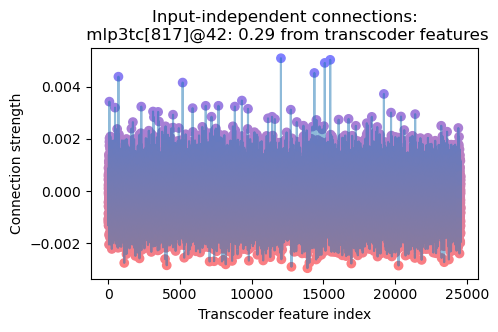

In [288]:
display_transcoder_pullback_features(model, all_paths[18][-1], transcoders[0])

In [290]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 12037, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 15474, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 15095, k=5)

Okay.... Previous token is `t`, I guess? Maybe as in "don't offer"?

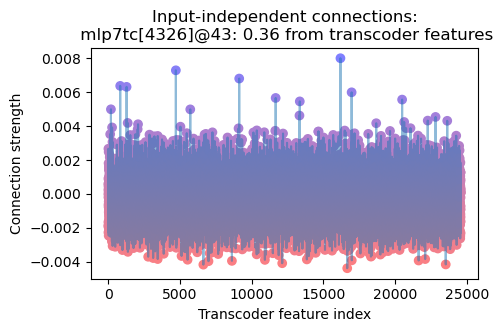

In [291]:
display_transcoder_pullback_features(model, all_paths[3][-1], transcoders[0])

In [292]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 16188, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 4706, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 9126, k=5)

Current token might be `provides` or `provide`, or also `offers` again?

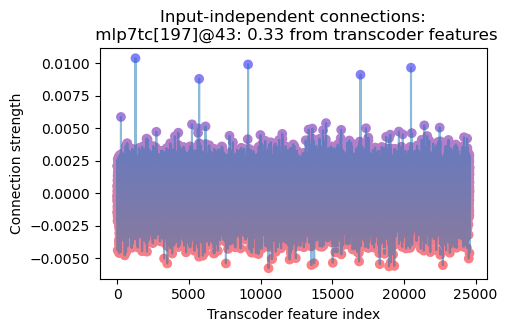

In [293]:
display_transcoder_pullback_features(model, all_paths[5][-1], transcoders[0])

In [294]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 1269, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 9126, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 20491, k=5)

Okay, maybe it is `offer`?

Back to the context.

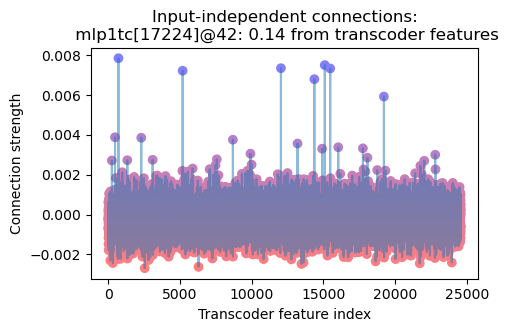

In [295]:
display_transcoder_pullback_features(model, all_paths[21][-1], transcoders[0])

In [296]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 700, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 12037, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 15095, k=5)

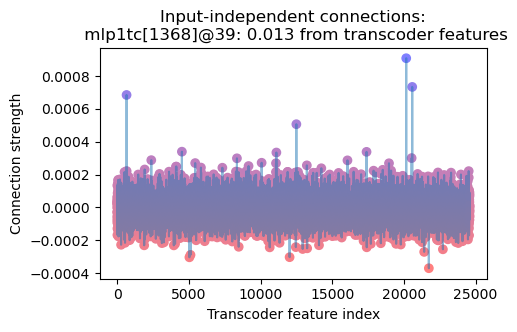

In [297]:
display_transcoder_pullback_features(model, all_paths[28][-1], transcoders[0])

In [298]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 20158, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 20577, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 649, k=5)

Okay, this prompt seems to be "won't offer" or "won't provide".

## Input 1115, 49

In [299]:
prompt = owt_tokens_torch[1115, :49+1]
_, cache = model.run_with_cache(prompt)

In [300]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[2725]@-1: 5.9 <- attn4[1]@45: 0.54
Path [1]: mlp8tc[2725]@-1: 5.9 <- attn6[11]@46: 0.53
Path [2]: mlp8tc[2725]@-1: 5.9 <- attn3[9]@46: 0.51
Path [3]: mlp8tc[2725]@-1: 5.9 <- attn8[5]@46: 0.39
Path [4]: mlp8tc[2725]@-1: 5.9 <- attn4[3]@48: 0.36
Path [5]: mlp8tc[2725]@-1: 5.9 <- mlp7tc[4326]@49: 0.34
Path [6]: mlp8tc[2725]@-1: 5.9 <- attn3[11]@45: 0.33
Path [7]: mlp8tc[2725]@-1: 5.9 <- attn6[0]@48: 0.3
Path [8]: mlp8tc[2725]@-1: 5.9 <- attn5[3]@45: 0.28
Path [9]: mlp8tc[2725]@-1: 5.9 <- mlp7tc[15304]@49: 0.27
Path [10]: mlp8tc[2725]@-1: 5.9 <- attn6[0]@47: 0.27
Path [11]: mlp8tc[2725]@-1: 5.9 <- attn8[4]@45: 0.27
Path [12]: mlp8tc[2725]@-1: 5.9 <- attn8[5]@48: 0.26
Path [13]: mlp8tc[2725]@-1: 5.9 <- mlp7tc[197]@49: 0.25
Path [14]: mlp8tc[2725]@-1: 5.9 <- attn1[0]@46: 0.24
Path [15]: mlp8tc[2725]@-1: 5.9 <- mlp7tc[21138]@49: 0.21
Path [16]: mlp8tc[2725]@-1: 5.9 <- attn5[3]@46: 0.21
Path [17]: mlp8tc[2725]@-1: 5.9 <- mlp1tc[4424]@49: 0.2
Path [18]: mlp8tc[2725]@-1: 5.9 <- 

Whoa, lots of contributions from far earlier in the context!

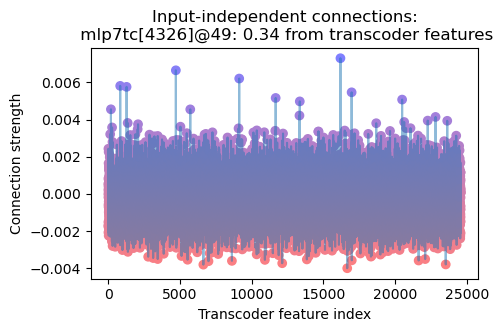

In [301]:
display_transcoder_pullback_features(model, all_paths[5][-1], transcoders[0])

In [304]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 9126, k=5)

Again with the "provide" and "offer".

Now, onto the context.

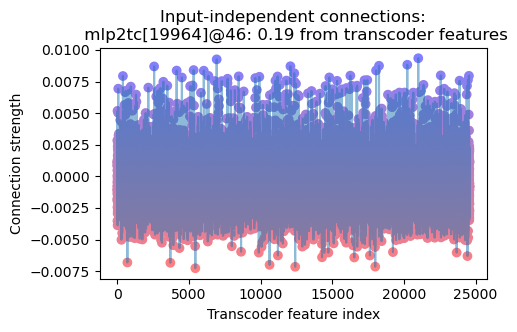

In [305]:
display_transcoder_pullback_features(model, all_paths[18][-1], transcoders[0])

In [306]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 20998, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 6935, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 20233, k=5)

All words that take the clitic `n't`.

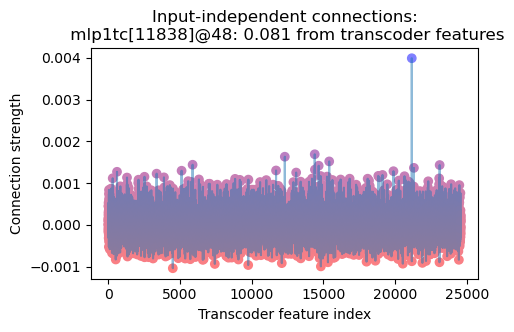

In [307]:
display_transcoder_pullback_features(model, all_paths[21][-1], transcoders[0])

In [309]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 21164, k=5)

Huhhhh!? Not what I was expecting at token 48.

In [317]:
all_paths = greedy_get_top_paths(model, transcoders, cache, my_feature, num_iters=6, num_branches=20)
all_paths = get_paths_via_filter(all_paths, suffix_path=[FeatureFilter(layer=0, layer_filter_type=FilterType.NE, token=49, token_filter_type=FilterType.NE)])
print_all_paths(all_paths)

Path [0]: mlp8tc[2725]@-1: 5.9 <- attn4[1]@45: 0.54
Path [1]: mlp8tc[2725]@-1: 5.9 <- attn6[11]@46: 0.53
Path [2]: mlp8tc[2725]@-1: 5.9 <- attn3[9]@46: 0.51
Path [3]: mlp8tc[2725]@-1: 5.9 <- attn8[5]@46: 0.39
Path [4]: mlp8tc[2725]@-1: 5.9 <- attn4[3]@48: 0.36
Path [5]: mlp8tc[2725]@-1: 5.9 <- attn3[11]@45: 0.33
Path [6]: mlp8tc[2725]@-1: 5.9 <- attn6[0]@48: 0.3
Path [7]: mlp8tc[2725]@-1: 5.9 <- attn5[3]@45: 0.28
Path [8]: mlp8tc[2725]@-1: 5.9 <- attn6[0]@47: 0.27
Path [9]: mlp8tc[2725]@-1: 5.9 <- attn8[4]@45: 0.27
Path [10]: mlp8tc[2725]@-1: 5.9 <- attn8[5]@48: 0.26
Path [11]: mlp8tc[2725]@-1: 5.9 <- attn1[0]@46: 0.24
Path [12]: mlp8tc[2725]@-1: 5.9 <- attn5[3]@46: 0.21
Path [13]: mlp8tc[2725]@-1: 5.9 <- attn3[9]@46: 0.51 <- mlp2tc[19964]@46: 0.19
Path [14]: mlp8tc[2725]@-1: 5.9 <- attn6[11]@46: 0.53 <- mlp5tc[7361]@46: 0.12
Path [15]: mlp8tc[2725]@-1: 5.9 <- attn6[11]@46: 0.53 <- attn3[11]@45: 0.11
Path [16]: mlp8tc[2725]@-1: 5.9 <- attn4[3]@48: 0.36 <- mlp1tc[11838]@48: 0.081
Path [

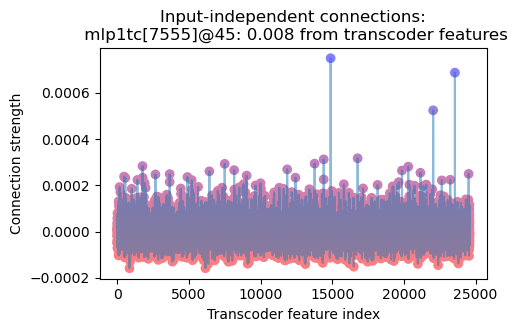

In [318]:
display_transcoder_pullback_features(model, all_paths[22][-1], transcoders[0])

In [320]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 23554, k=5)

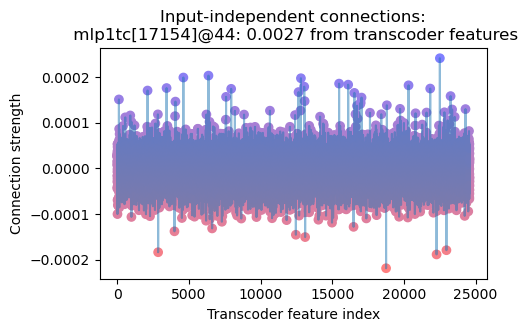

In [321]:
display_transcoder_pullback_features(model, all_paths[23][-1], transcoders[0])

In [323]:
display_deembeddings_for_transcoder_feature(model, transcoders[0], 22505, k=5)
display_deembeddings_for_transcoder_feature(model, transcoders[0], 6362, k=5)

## Moment of truth

**Final hypothesis**: talking about not offering things or not providing things. (Stretch: particularly in legalese context?)

In [324]:
display_activating_examples_dash(model, owt_tokens_torch[:128*100], scores, window_size=7)

Mostly a success (the stretch part of the hypothesis wasn't borne out by the data).